very rough guess. code below is nasty - no expectations of you reviewing my code:

H0.1) - finds when two letters match, off of the main diagonal - but misses 'a' matches
H0.0) - copies all letters, in order, to shared memory (duplicate letters with self are not copied however; self is also not copied, but this is ok because self exists as the original element of the resid stream).  qtok-kpos subcircuit shows that letters will be ordered in this shared memory from left to right - so we can selected an ordered one later if desired.
H0.2) - finds when some specific letters match, off of the main diagonal - specifically, gets 'a' (which was missed in H0.1).  as well as 'b' and 'g'.  This head might also be doing something that looks similar to H0.0 - either in the same direction or opposite direction.  

Note that this hypothesized Layer 0 mechanism is pretty reasonable without layer 1.
It gets all sequences of lengths 1 - 3 correct.  
It gets all sequences when the first letter doesn't repeat correct (by suggesting the first letter).
It gets all sequences when the current letter matches the first letter and the second letter doesn't repeat correct (by suggesting the second letter).

The thing missing is a component the discourages a repeating letter when that letter isn't the last letter.  This is what layer 1 does. (I think).
H1.0) discourages 'a' and 'c' when they repeat.
H1.1) discourages 'd','e', 'f', and 'j' when they repeat.  possibly slight discouragement on 'i' when it repeats
H1.2) discourages 'b','g', 'h', and 'i' when they repeat.  
Each letter is hit by 1 head.

Note that this discouragement combined with H0.0) allows a theoretically optimal mechanism to get the correct letter.

The mechanism isn't optimal though, layer 1 discouragement seems to sometimes fight with itself along the same head when it wants to discourage multiple letters.  I think it's also weaker as window gets longer.

In [1]:
import os; os.environ["ACCELERATE_DISABLE_RICH"] = "1"
import sys
import torch.nn.functional as F


In [2]:
import torch as t
from pathlib import Path

# Make sure exercises are in the path
chapter = r"chapter1_transformers"
exercises_dir = Path(f"{os.getcwd().split(chapter)[0]}/{chapter}/exercises").resolve()
section_dir = exercises_dir / "monthly_algorithmic_problems" / "august23_unique_char"
if str(exercises_dir) not in sys.path: sys.path.append(str(exercises_dir))

from dataset import UniqueCharDataset, find_first_unique
from model import create_model


device = "cuda" 

In [3]:
filename = "first_unique_char_model.pt"

model = create_model(
    seq_len=20,
    vocab=list("abcdefghij"),
    seed=42,
    d_model=42,
    d_head=14,
    n_layers=2,
    n_heads=3,
    normalization_type="LN",
    d_mlp=None # attn-only model
)

state_dict = t.load(filename)

state_dict = model.center_writing_weights(t.load(filename))
state_dict = model.center_unembed(state_dict)
state_dict = model.fold_layer_norm(state_dict)
state_dict = model.fold_value_biases(state_dict)
model.load_state_dict(state_dict, strict=False);

In [4]:
print(model)

HookedTransformer(
  (embed): Embed()
  (hook_embed): HookPoint()
  (pos_embed): PosEmbed()
  (hook_pos_embed): HookPoint()
  (hook_tokens): HookPoint()
  (blocks): ModuleList(
    (0-1): 2 x TransformerBlock(
      (ln1): LayerNorm(
        (hook_scale): HookPoint()
        (hook_normalized): HookPoint()
      )
      (attn): Attention(
        (hook_k): HookPoint()
        (hook_q): HookPoint()
        (hook_v): HookPoint()
        (hook_z): HookPoint()
        (hook_attn_scores): HookPoint()
        (hook_pattern): HookPoint()
        (hook_result): HookPoint()
      )
      (hook_q_input): HookPoint()
      (hook_k_input): HookPoint()
      (hook_v_input): HookPoint()
      (hook_attn_out): HookPoint()
      (hook_mlp_out): HookPoint()
      (hook_resid_pre): HookPoint()
      (hook_resid_post): HookPoint()
    )
  )
  (ln_final): LayerNorm(
    (hook_scale): HookPoint()
    (hook_normalized): HookPoint()
  )
  (unembed): Unembed()
)


In [26]:
for name, param in model.named_parameters():
    print(f'Layer: {name}')
    print(f'Size: {param.size()}')
    print(f'Mean: {param.mean()}')
    print(f'Standard deviation: {param.std()}')
    print()

Layer: embed.W_E
Size: torch.Size([11, 42])
Mean: 1.4191582353717536e-09
Standard deviation: 0.17455659806728363

Layer: pos_embed.W_pos
Size: torch.Size([20, 42])
Mean: -2.1287374640799328e-10
Standard deviation: 0.08910293877124786

Layer: blocks.0.ln1.w
Size: torch.Size([42])
Mean: 1.0
Standard deviation: 0.0

Layer: blocks.0.ln1.b
Size: torch.Size([42])
Mean: 0.0
Standard deviation: 0.0

Layer: blocks.0.attn.W_Q
Size: torch.Size([3, 42, 14])
Mean: 0.0
Standard deviation: 0.13701023161411285

Layer: blocks.0.attn.W_K
Size: torch.Size([3, 42, 14])
Mean: 4.054737656744578e-10
Standard deviation: 0.13637617230415344

Layer: blocks.0.attn.W_V
Size: torch.Size([3, 42, 14])
Mean: 2.703158530348304e-10
Standard deviation: 0.1239829733967781

Layer: blocks.0.attn.W_O
Size: torch.Size([3, 14, 42])
Mean: -1.68947408146769e-11
Standard deviation: 0.12501375377178192

Layer: blocks.0.attn.b_Q
Size: torch.Size([3, 14])
Mean: 0.044300515204668045
Standard deviation: 0.11775831133127213

Layer: bl

In [48]:
pos = model.pos_embed.W_pos
W_Q_0 = model.blocks[0].attn.W_Q
W_K_0 = model.blocks[0].attn.W_K

W_Q_1 = model.blocks[1].attn.W_Q
W_K_1 = model.blocks[1].attn.W_K

In [28]:
print(pos.shape)
print(W_Q_0.shape)
print(W_K_0.shape)

torch.Size([20, 42])
torch.Size([3, 42, 14])
torch.Size([3, 42, 14])


In [49]:
posQ = torch.einsum("ab,hbd->had",pos,W_Q_0)
posK = torch.einsum("ab,hbd->had",pos,W_K_0)

posQ1 = torch.einsum("ab,hbd->had",pos,W_Q_1)
posK1 = torch.einsum("ab,hbd->had",pos,W_K_1)

In [30]:
print(posQ.shape)
print(posK.shape)

torch.Size([3, 20, 14])
torch.Size([3, 20, 14])


In [31]:
embed = model.embed.W_E

In [32]:
embed.shape

torch.Size([11, 42])

In [50]:
eQ = torch.einsum("ab,hbd->had",embed,W_Q_0)
eK = torch.einsum("ab,hbd->had",embed,W_K_0)

eQ1 = torch.einsum("ab,hbd->had",embed,W_Q_1)
eK1 = torch.einsum("ab,hbd->had",embed,W_K_1)

In [34]:
print(eK.shape)
print(eQ.shape)
print(posQ.shape)
print(posK.shape)

torch.Size([3, 11, 14])
torch.Size([3, 11, 14])
torch.Size([3, 20, 14])
torch.Size([3, 20, 14])


In [51]:
posQposK = torch.einsum("has,hbs->hab",posQ,posK)
posQeK   = torch.einsum("has,hbs->hab",posQ,eK)
eQposK   = torch.einsum("has,hbs->hab",eQ,posK)
eQeK     = torch.einsum("has,hbs->hab",eQ,eK)

posQ1posK1 = torch.einsum("has,hbs->hab",posQ1,posK1)
posQ1eK1   = torch.einsum("has,hbs->hab",posQ1,eK1)
eQ1posK1   = torch.einsum("has,hbs->hab",eQ1,posK1)
eQ1eK1     = torch.einsum("has,hbs->hab",eQ1,eK1)

In [36]:
print(posQposK.shape)
print(posQeK.shape)
print(eQposK.shape)
print(eQeK.shape)

torch.Size([3, 20, 20])
torch.Size([3, 20, 11])
torch.Size([3, 11, 20])
torch.Size([3, 11, 11])


In [ ]:
for i in range(3):
    print(posQposK[i])

In [ ]:
for i in range(3):
    print(eQeK[i].diag())

In [ ]:
eQeK[0]

In [ ]:
for i in range(11):
    print (eQeK[0][i][i].item(),eQeK[1][i][i].item(),eQeK[2][i][i].item())




In [ ]:
for i in range(9):
    print (eQeK[0][i][i].item(),eQeK[0][i+1][i].item(),eQeK[0][i+2][i].item())

In [ ]:
for i in range(33):
    print (eQposK[0][i])
    print (posQeK[0][:,i])

In [ ]:
print(posQposK[0].shape)

In [ ]:
def sm(t,head = 0):
    softmax_x = F.softmax(t, dim=1)

    for i in range(len(softmax_x[head,:])):
        print(softmax_x[head,i,len(softmax_x[head,:])-1-i].item(),softmax_x[head,i,i].item(),1.0/len(softmax_x[head,:]))
        
sm(posQposK, head = 0)
print("\n")
sm(posQposK, head = 1)

In [ ]:
sm(eQeK, head = 0)
print("\n")
sm(eQeK, head = 1)

In [ ]:
pos = model.pos_embed.W_pos
W_Q_0 = model.blocks[0].attn.W_Q
W_K_0 = model.blocks[0].attn.W_K

In [ ]:
W_V_0 = model.blocks[0].attn.W_V
posV = torch.einsum("ab,hbd->had",pos,W_V_0)
eV = torch.einsum("ab,hbd->had",embed,W_V_0)


In [ ]:
print(posV.shape)
print(eV.shape)

In [ ]:
W_O_0 = model.blocks[0].attn.W_O
print(W_O_0.shape)
posVO = torch.einsum("hbd,hde->hbe",posV,W_O_0)
embedVO = torch.einsum("hbd,hde->hbe",eV,W_O_0)

In [ ]:
print(posVO.shape)
print(pos.shape)

In [ ]:
posVO_dot_pos = torch.einsum("bd,hcd->hbc",pos,posVO)


In [ ]:
print(posVO_dot_pos.shape)

In [ ]:
print(posVO_dot_pos[0])

In [ ]:
embedVO_dot_embed = torch.einsum("bd,hcd->hbc",embed,embedVO)

In [ ]:
for i in range(33):
    print(embedVO_dot_embed[0][i,i])

In [ ]:
for i in range(len(embedVO[0])):
    print (embedVO[0])

In [ ]:
print(W_V_0.shape)
print(W_O_0.shape)

In [ ]:
VO = torch.einsum("hab,hbc->hac",W_V_0,W_O_0)

In [ ]:
print(VO.shape)

In [167]:
import torch as t
from torch.utils.data import Dataset
from typing import List
from tqdm import tqdm



class UniqueCharDataset(Dataset):

    def __init__(self, size: int, vocab: List[str], seq_len: int, seed: int = 42):
        '''
        We create our non-palindromic examples via the following process (for each sequence):

            1. Generate a random seq of length N/2
            2. Generate another random seq of length N/2, by randomly changing X values of the previous
               seq, where X is some random integer between 0 and N/2 inclusive.
            3. Concatenate the two sequences (flipping the second one)
        
        This makes sure we have a good variety of palindromic numbers, including quite a lot with only
        one number flipped (otherwise it would be too easy for the model to distinguish).
        '''
        self.vocab = vocab + ["?"]
        self.null_tok = len(vocab)  # The null token is used as a [START] token for input, and [no unique char exists] for output
        self.size = size
        t.manual_seed(seed)  # for reproducible results

        # Generate our sequences
        self.toks = t.concat([
            t.full((size, 1), fill_value=self.null_tok),
            t.randint(low=0, high=self.null_tok, size=(size, seq_len-1))
        ], dim=1)
        self.toks = torch.tensor([
#                                   [3, 0, 0, 0],
#                                   [3, 0, 0, 1],
#                                   [3, 0, 0, 2],
                                  [10, 0, 2, 0, 2, 3, 4, 3, 4, 5, 7, 5, 7],
                                  [10, 6, 2, 8, 9, 6, 3, 4, 4, 5, 5, 7, 7],
                                  [10, 2, 6, 8, 9, 2, 3, 4, 4, 5, 5, 7, 7],      
            
                                  [10, 1, 2, 1, 2, 3, 4, 3, 4, 5, 7, 5, 7],
#                                   [10, 1, 2, 3, 1, 2, 3, 4, 5, 7, 4, 5, 7],
                                  [10, 1, 1, 2, 2, 3, 3, 4, 4, 5, 5, 7, 7],
                                  [10, 1, 2, 2, 1, 3, 3, 4, 4, 5, 5, 7, 7],

                                  [10, 1, 2, 8, 9, 1, 3, 4, 4, 5, 5, 7, 7],
                                  [10, 2, 1, 8, 9, 2, 3, 4, 4, 5, 5, 7, 7],

#                                   [3, 1, 2, 0, 2],
#                                   [3, 1, 1, 1, 2],
#                                   [3, 1, 1, 2, 2],
#                                   [3, 2, 2, 0, 2],
#                                   [3, 2, 1, 0, 2],
#                                   [3, 2, 2, 1, 2],
#                                   [3, 2, 2, 2, 2],
                                 
                                 ])
        
        self.toks = torch.zeros((50,6), )
        done = 0
        for i in range(5):
            for j in range(5,10):
                self.toks[done] = torch.tensor([10, i, j, i, j,9])
                self.toks[done+1] = torch.tensor([10, j, i, j, i,4])
                done += 2
        
        self.toks = self.toks.to(dtype=torch.int32)
        print(self.toks)
        
        self.str_toks = [
            [self.vocab[tok] for tok in seq]
            for seq in self.toks
        ]

        # Generate our labels (i.e. the identity of the first non-repeating character in each sequence)
        self.labels = find_first_unique(self.toks[:, 1:], self.null_tok)
        self.labels = t.cat([
            t.full((size, 1), fill_value=self.null_tok),
            self.labels
        ], dim=1)
        self.str_tok_labels = [
            [self.vocab[tok] for tok in seq]
            for seq in self.labels
        ]

    def __getitem__(self, index):
        return self.toks[index], self.labels[index]

    def __len__(self):
        return self.size

    def to(self, device: str):
        self.toks = self.toks.to(device)
        self.labels = self.labels.to(device)
        return self



def find_first_unique(toks, null_tok):
    '''
    Function which takes a 2D tensor, and returns a tensor where the [i, j]-th element is
    the first non-repeating element in the [i, :j+1]-th slice of the input tensor (or `null_tok`
    if no such element exists)
    '''
    batch_size, seq_len = toks.shape
    results = t.full_like(toks, fill_value=null_tok)
    iterator = toks.tolist() if batch_size < 10_000 else tqdm(toks.tolist(), desc="Finding first unique tokens")

    # Create a dict which tracks the number of occurrences of each token in each sequence,
    # i.e. dict[i][b, s] = number of occurrences of token i in toks[b, :s+1]
    number_of_occurrences_dict = {}
    for tok in range(null_tok):
        occurrences = t.zeros((batch_size, seq_len+1), dtype=t.int)
        for j in range(1, seq_len+1):
            occurrences[:, j] = occurrences[:, j-1] + (toks[:, j-1] == tok).int()
        number_of_occurrences_dict[tok] = occurrences[:, 1:].tolist()

    for batch_idx, seq in enumerate(iterator):
        for seq_pos, tok in enumerate(seq):
            for first_unique_seq_pos, first_unique_tok in enumerate(seq[:seq_pos+1]):
                occurrences = number_of_occurrences_dict[first_unique_tok][batch_idx][seq_pos]
                if occurrences == 1:
                    results[batch_idx, seq_pos] = first_unique_tok
                    break

    return results


                

# # Let's test the function with a sample tensor
# T = t.tensor([[1, 2, 1, 3, 2], [4, 5, 4, 6, 5]])
# find_first_unique(T)


## day 2

In [168]:
dataset = UniqueCharDataset(size=50, vocab=list("abcdefghij"), seq_len=6, seed=42)

logits, cache = model.run_with_cache(dataset.toks)

logprobs = logits.log_softmax(-1) # [batch seq_len d_vocab]
probs = logprobs.softmax(-1) # [batch seq_len d_vocab]

batch_size, seq_len = dataset.toks.shape
logprobs_correct = logprobs[t.arange(batch_size)[:, None], t.arange(seq_len)[None, :], dataset.labels] # [batch seq_len]
probs_correct = probs[t.arange(batch_size)[:, None], t.arange(seq_len)[None, :], dataset.labels] # [batch seq_len]

avg_cross_entropy_loss = -logprobs_correct.mean().item()
avg_correct_prob = probs_correct.mean().item()
min_correct_prob = probs_correct.min().item()

print(f"Average cross entropy loss: {avg_cross_entropy_loss:.3f}")
print(f"Average probability on correct label: {avg_correct_prob:.3f}")
print(f"Min probability on correct label: {min_correct_prob:.3f}")

tensor([[10,  0,  5,  0,  5,  9],
        [10,  5,  0,  5,  0,  4],
        [10,  0,  6,  0,  6,  9],
        [10,  6,  0,  6,  0,  4],
        [10,  0,  7,  0,  7,  9],
        [10,  7,  0,  7,  0,  4],
        [10,  0,  8,  0,  8,  9],
        [10,  8,  0,  8,  0,  4],
        [10,  0,  9,  0,  9,  9],
        [10,  9,  0,  9,  0,  4],
        [10,  1,  5,  1,  5,  9],
        [10,  5,  1,  5,  1,  4],
        [10,  1,  6,  1,  6,  9],
        [10,  6,  1,  6,  1,  4],
        [10,  1,  7,  1,  7,  9],
        [10,  7,  1,  7,  1,  4],
        [10,  1,  8,  1,  8,  9],
        [10,  8,  1,  8,  1,  4],
        [10,  1,  9,  1,  9,  9],
        [10,  9,  1,  9,  1,  4],
        [10,  2,  5,  2,  5,  9],
        [10,  5,  2,  5,  2,  4],
        [10,  2,  6,  2,  6,  9],
        [10,  6,  2,  6,  2,  4],
        [10,  2,  7,  2,  7,  9],
        [10,  7,  2,  7,  2,  4],
        [10,  2,  8,  2,  8,  9],
        [10,  8,  2,  8,  2,  4],
        [10,  2,  9,  2,  9,  9],
        [10,  

In [169]:
print(dataset.toks)
print(dataset.labels)

tensor([[10,  0,  5,  0,  5,  9],
        [10,  5,  0,  5,  0,  4],
        [10,  0,  6,  0,  6,  9],
        [10,  6,  0,  6,  0,  4],
        [10,  0,  7,  0,  7,  9],
        [10,  7,  0,  7,  0,  4],
        [10,  0,  8,  0,  8,  9],
        [10,  8,  0,  8,  0,  4],
        [10,  0,  9,  0,  9,  9],
        [10,  9,  0,  9,  0,  4],
        [10,  1,  5,  1,  5,  9],
        [10,  5,  1,  5,  1,  4],
        [10,  1,  6,  1,  6,  9],
        [10,  6,  1,  6,  1,  4],
        [10,  1,  7,  1,  7,  9],
        [10,  7,  1,  7,  1,  4],
        [10,  1,  8,  1,  8,  9],
        [10,  8,  1,  8,  1,  4],
        [10,  1,  9,  1,  9,  9],
        [10,  9,  1,  9,  1,  4],
        [10,  2,  5,  2,  5,  9],
        [10,  5,  2,  5,  2,  4],
        [10,  2,  6,  2,  6,  9],
        [10,  6,  2,  6,  2,  4],
        [10,  2,  7,  2,  7,  9],
        [10,  7,  2,  7,  2,  4],
        [10,  2,  8,  2,  8,  9],
        [10,  8,  2,  8,  2,  4],
        [10,  2,  9,  2,  9,  9],
        [10,  

In [170]:
import numpy as np
def plot_heatmap(tensor, labels=None, title = "blank"):
    tensor = tensor.detach().cpu().numpy()
#     if tensor.shape != torch.Size([31, 31]):
#         raise ValueError('Expected a tensor of shape (31, 31), but got tensor with shape {}.'.format(tensor.shape))
    
    # Plotting
    plt.figure(figsize=(8, 8))
    plt.imshow(tensor, cmap='coolwarm', interpolation='nearest')
    plt.title(title)
    plt.colorbar()
    
    if labels is not None:
        num_labels = len(labels)

        plt.xticks(np.arange(num_labels), labels, rotation='vertical')
        plt.yticks(np.arange(num_labels), labels)
    
    plt.show()


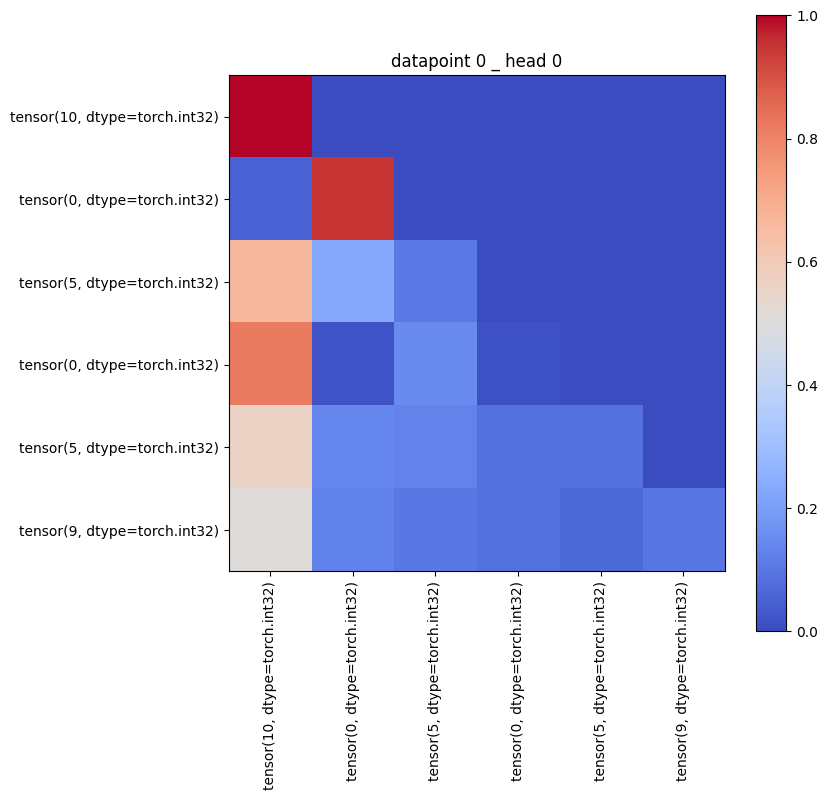

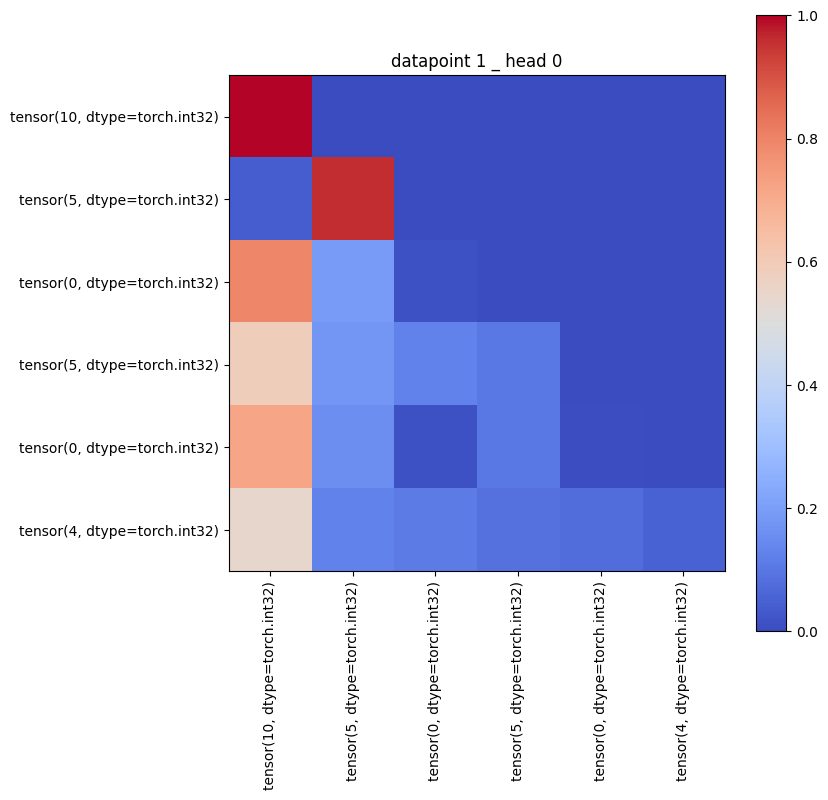

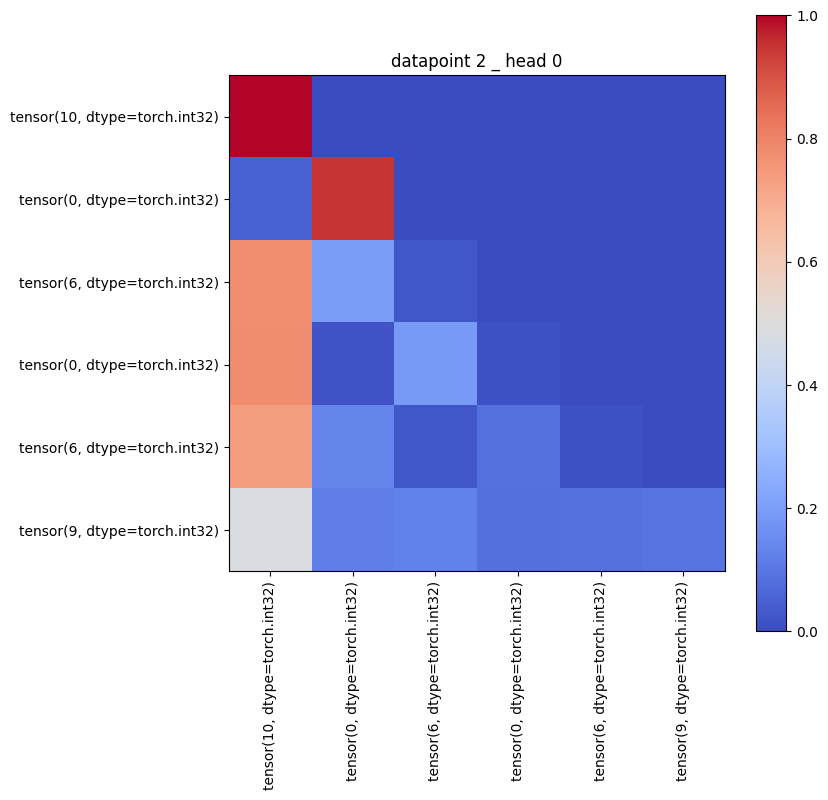

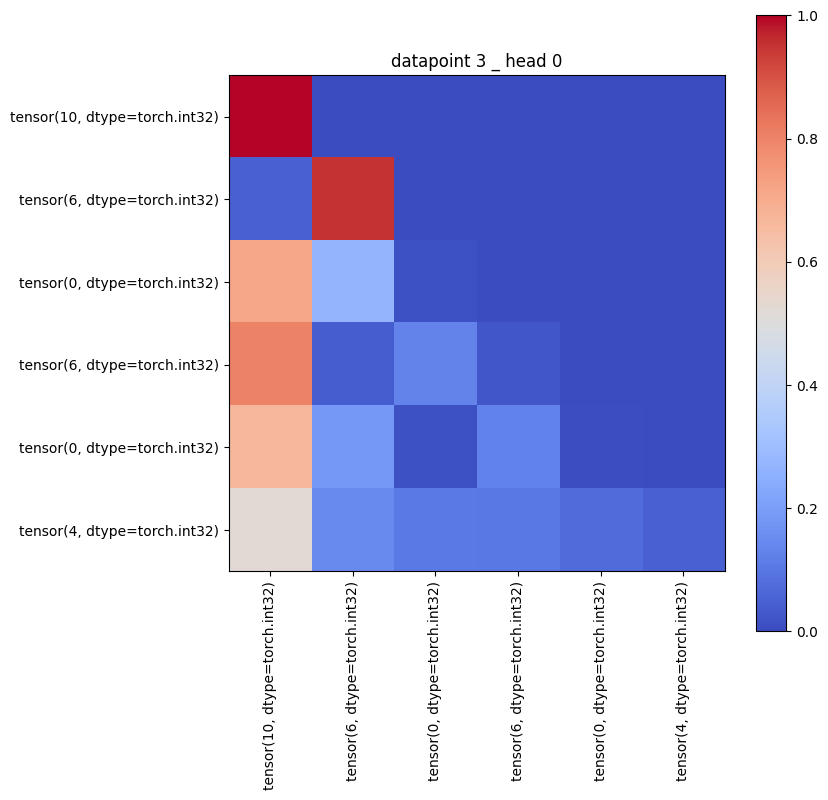

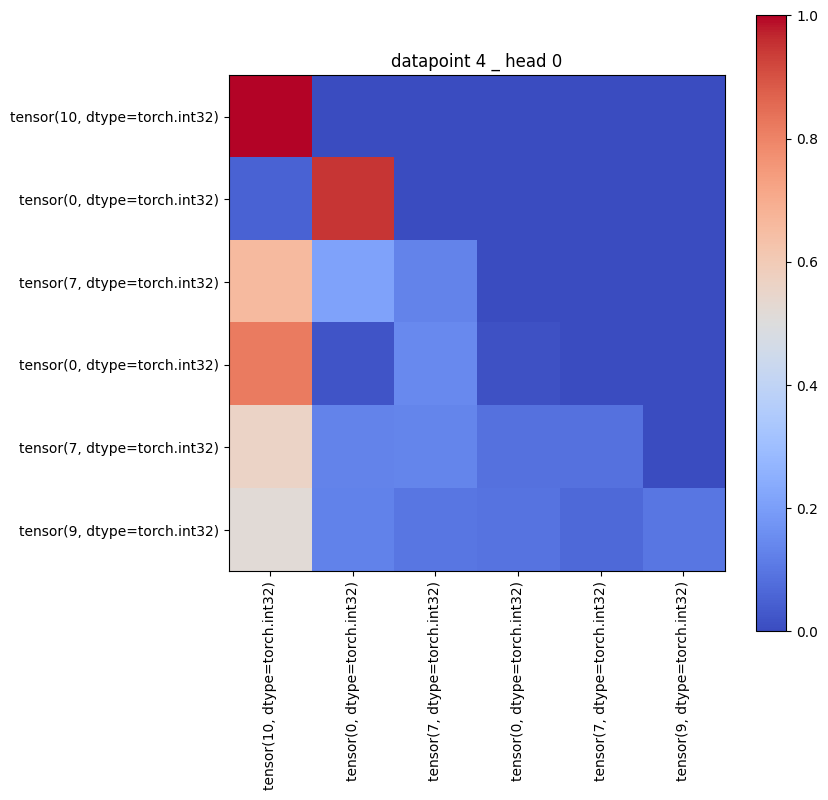

...

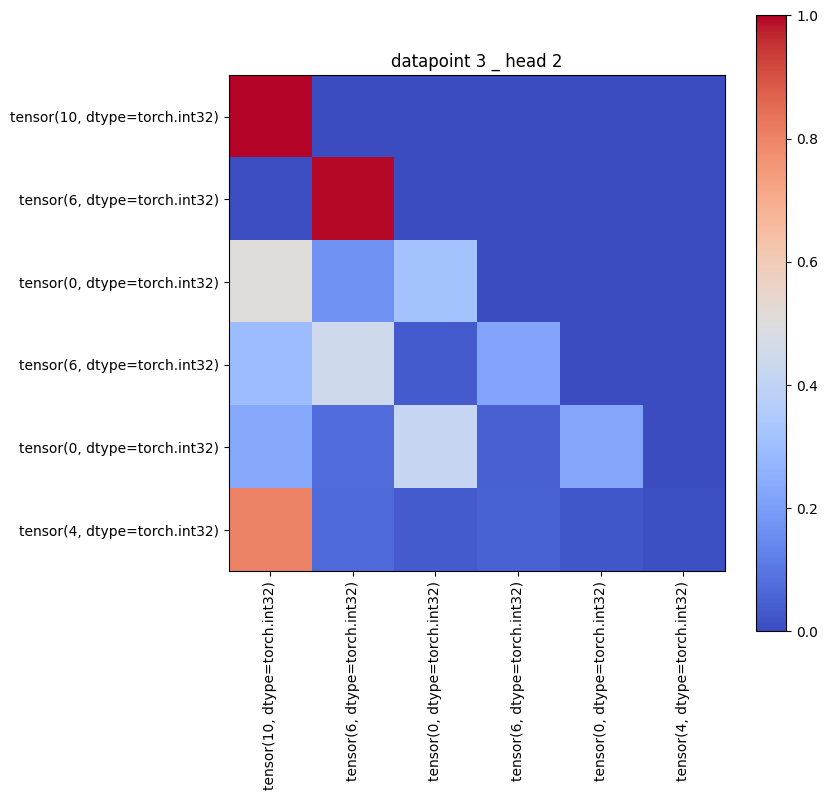

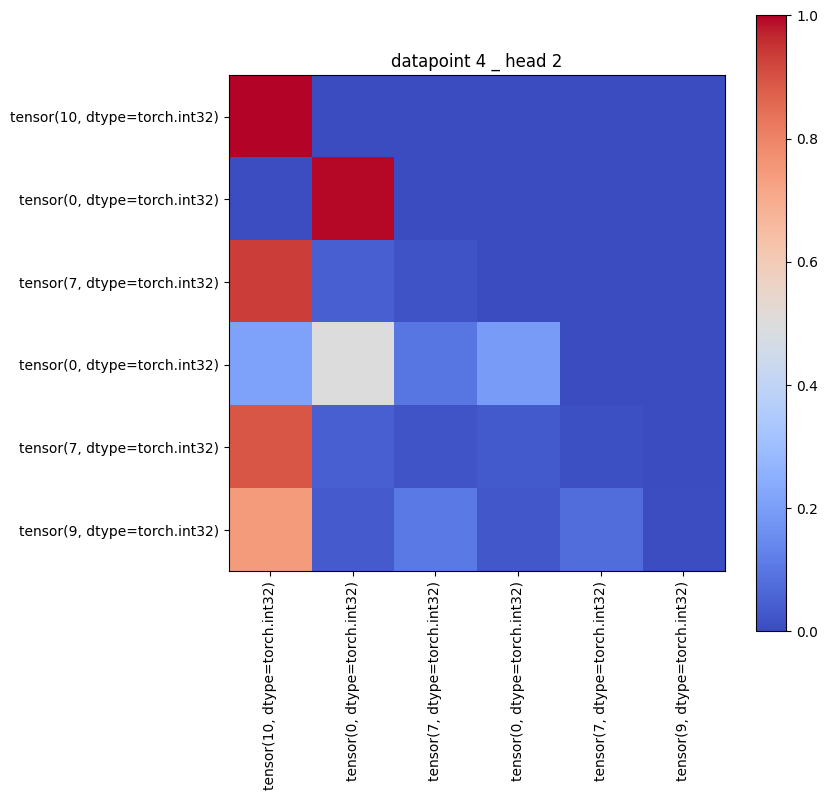

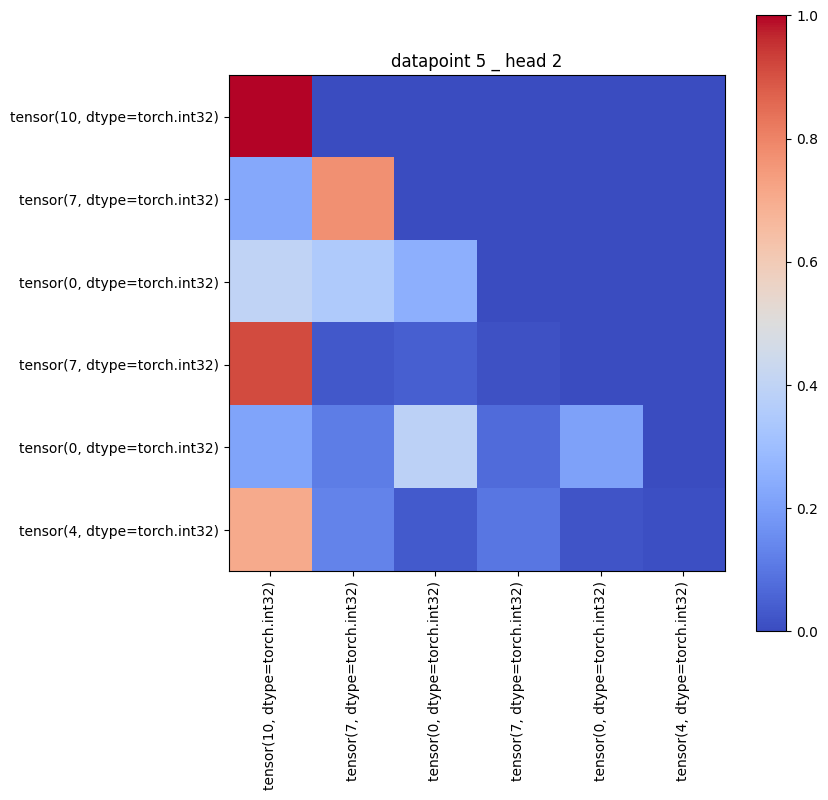

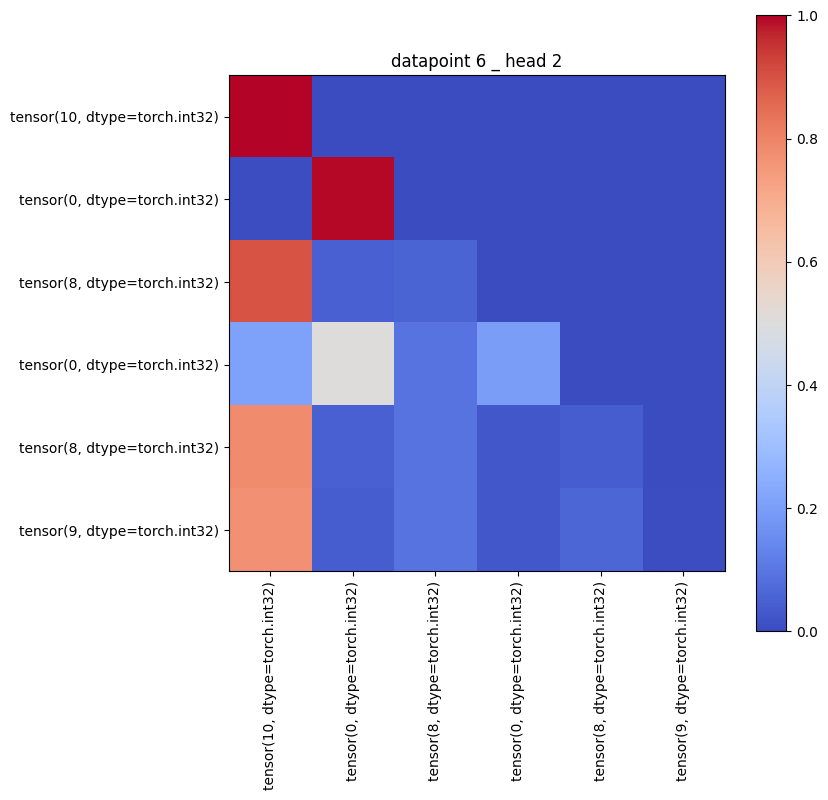

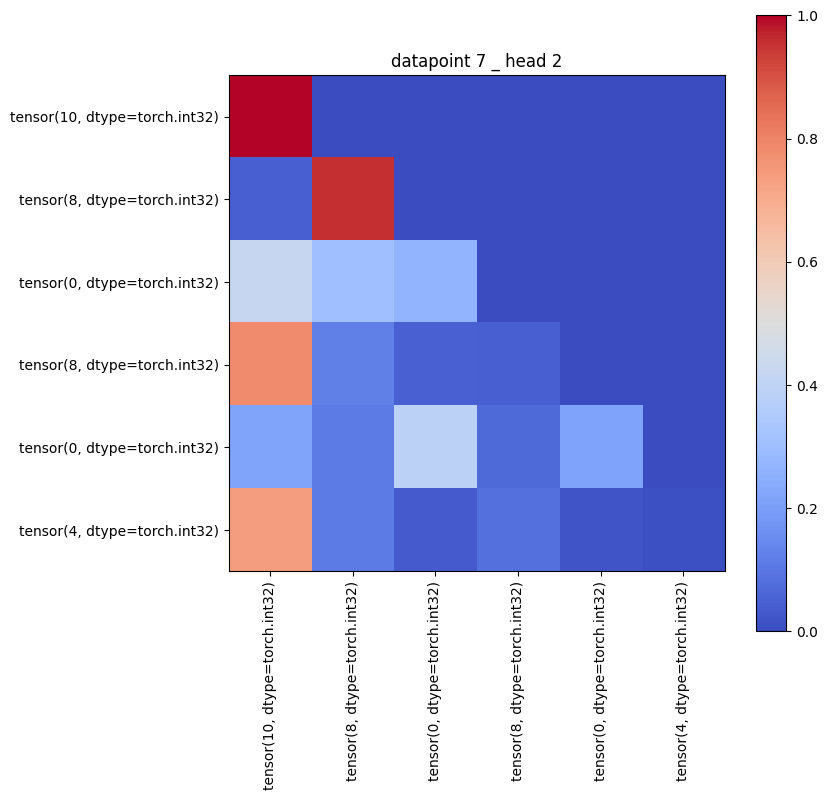

In [171]:

for h in range(3):
    for i in range(8):
        plot_heatmap(cache['blocks.0.attn.hook_pattern'][i,h],dataset.toks[i], title=f"datapoint {i} _ head {h}")





In [37]:
print(posQposK.shape)
print(posQeK.shape)
print(eQposK.shape)
print(eQeK.shape)

torch.Size([3, 20, 20])
torch.Size([3, 20, 11])
torch.Size([3, 11, 20])
torch.Size([3, 11, 11])


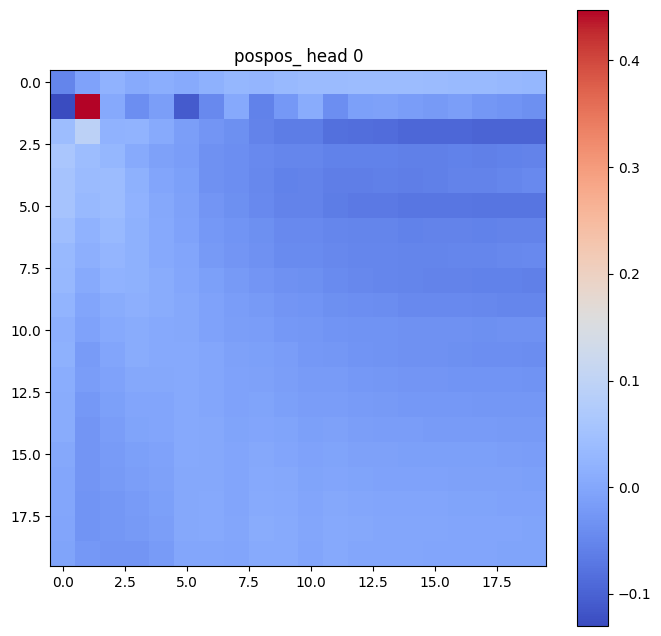

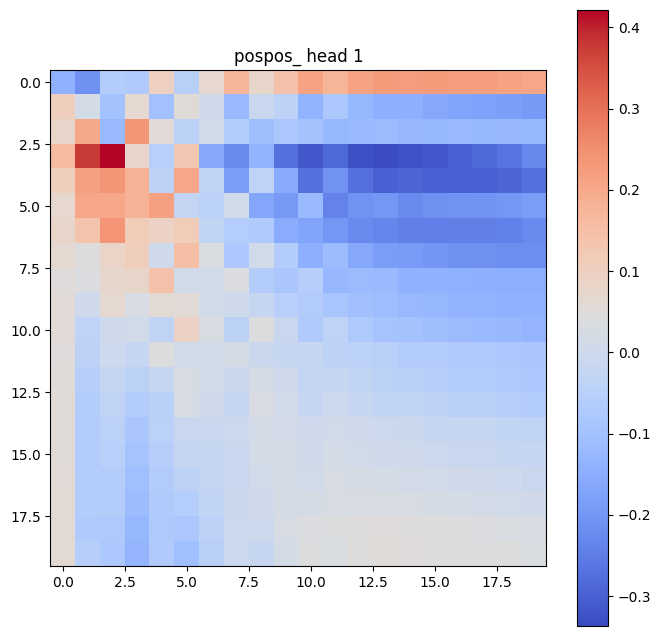

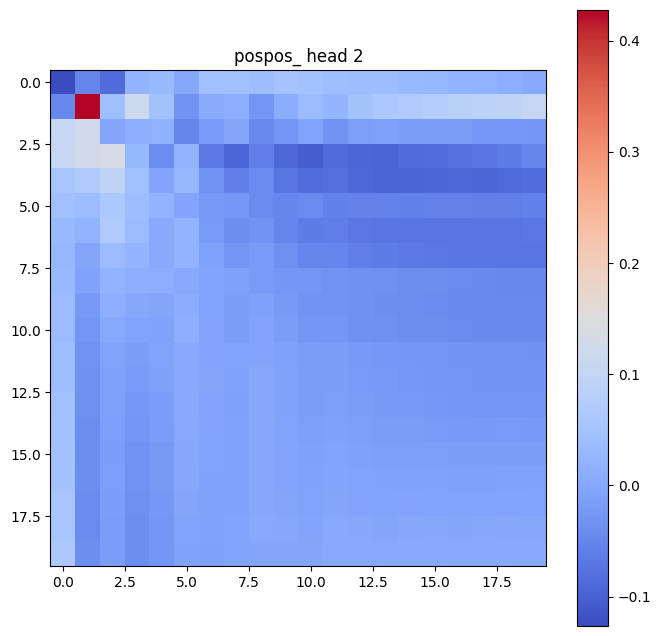

In [43]:
for h in range(3):
    plot_heatmap(posQposK[h], title=f"pospos_ head {h}")



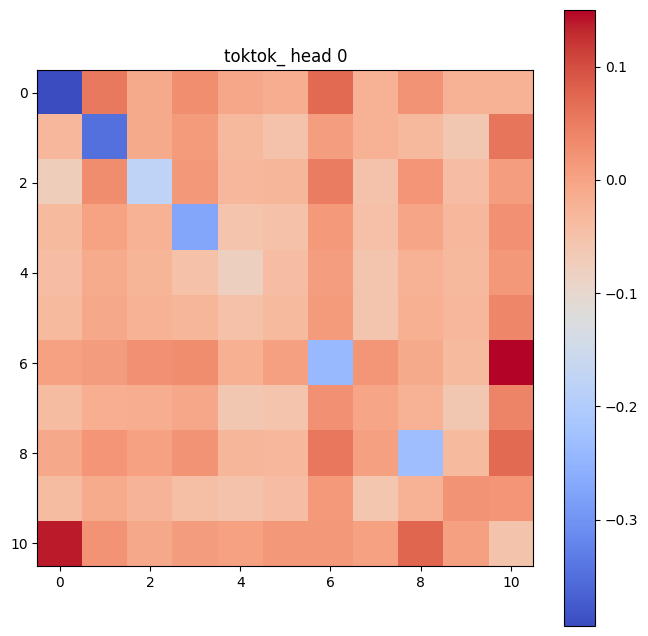

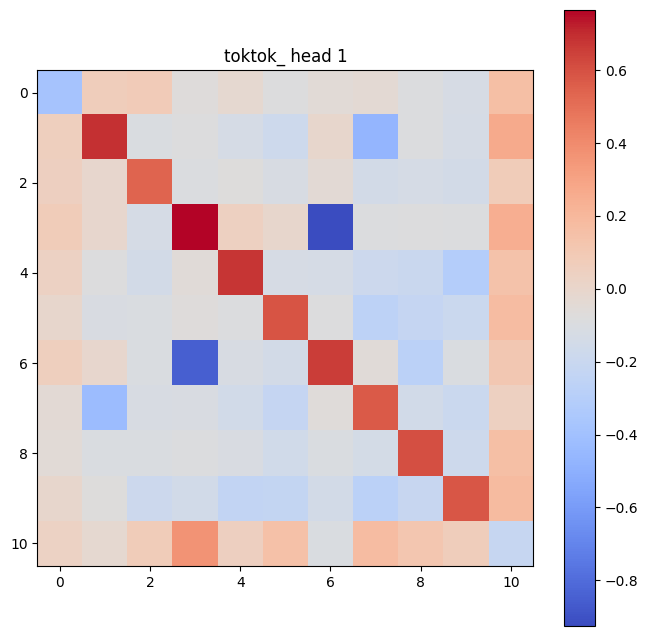

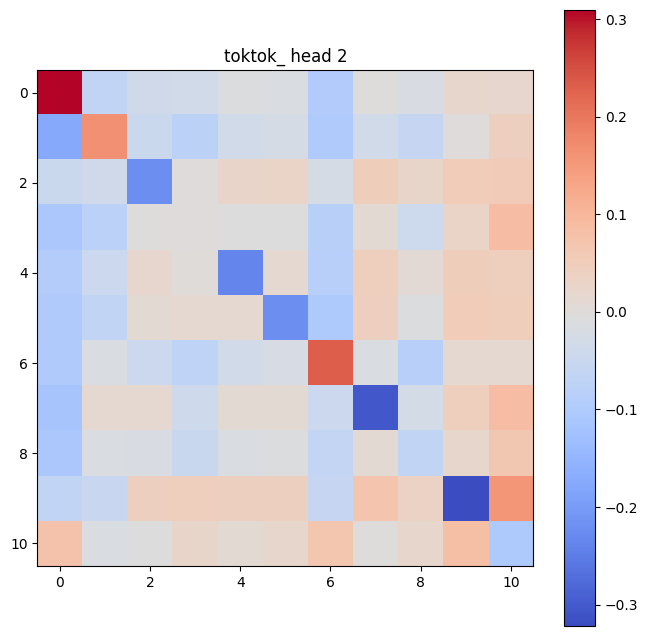

In [147]:
for h in range(3):
    plot_heatmap(eQeK[h], title=f"toktok_ head {h}")


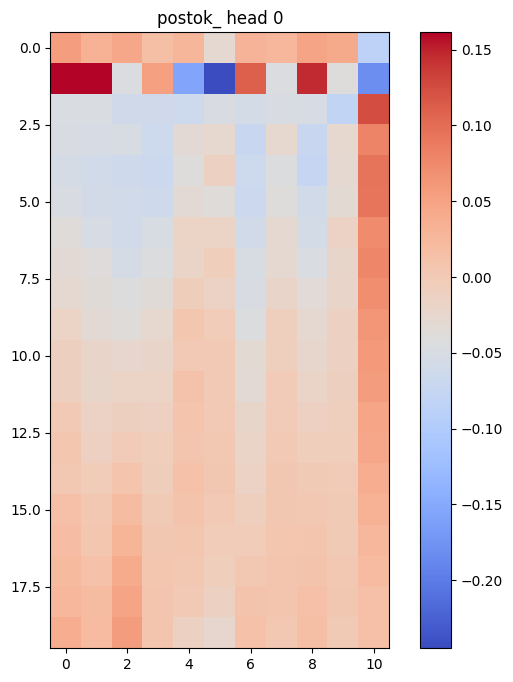

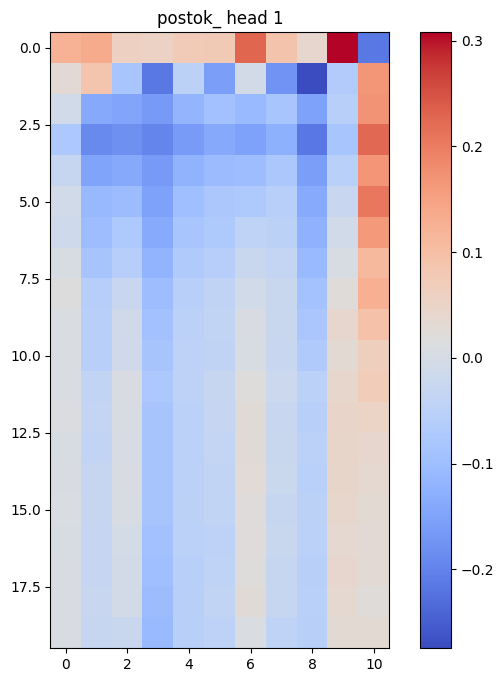

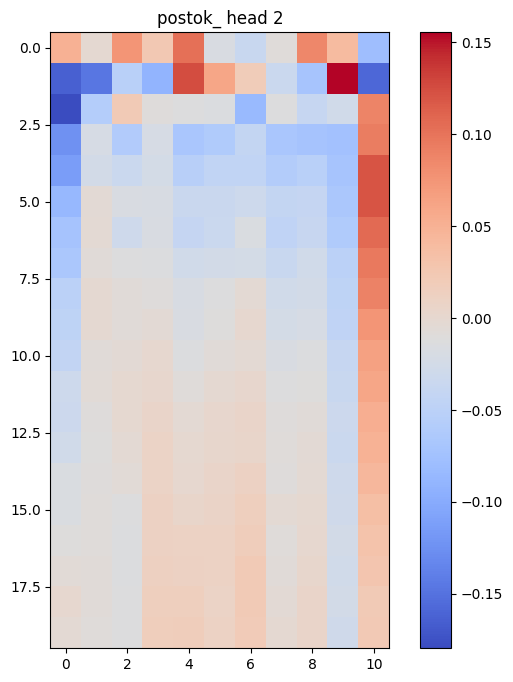

In [148]:
for h in range(3):
    plot_heatmap(posQeK[h], title=f"postok_ head {h}")

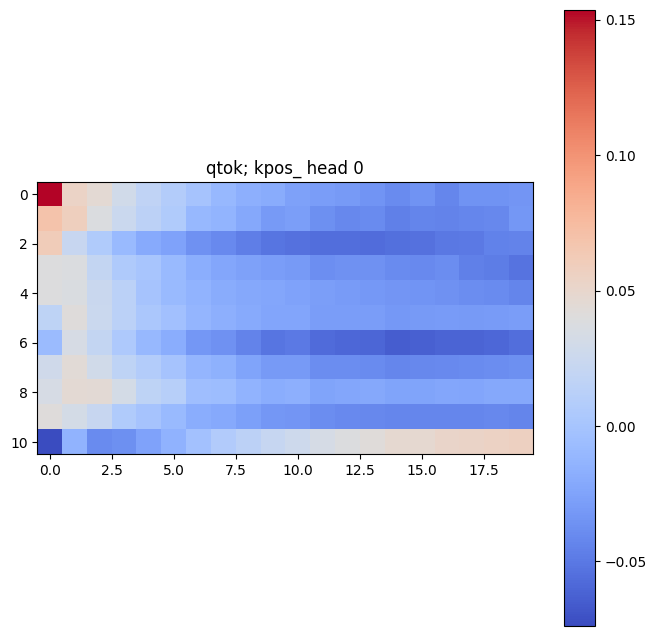

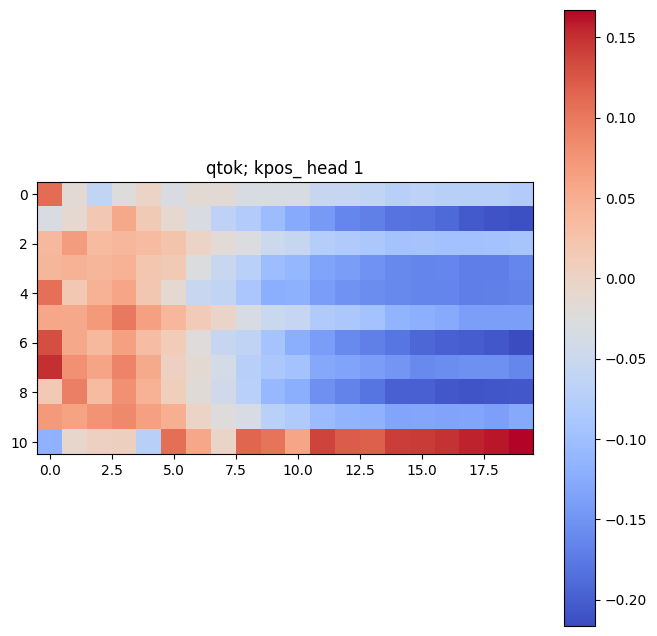

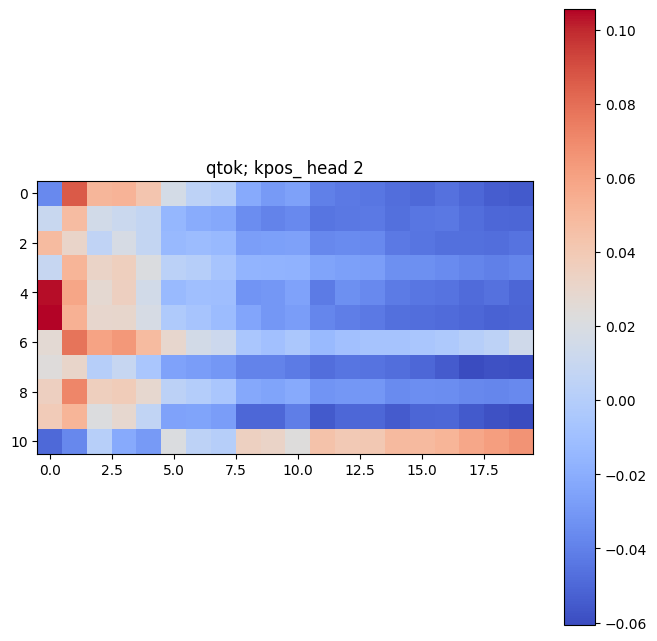

In [67]:
for h in range(3):
    plot_heatmap(eQposK[h], title=f"qtok; kpos_ head {h}")

# other layer:

In [46]:
cache['blocks.0.hook_resid_post'].shape

torch.Size([1000, 20, 42])

In [47]:
cache


ActivationCache with keys ['hook_tokens', 'hook_embed', 'hook_pos_embed', 'blocks.0.hook_resid_pre', 'blocks.0.hook_q_input', 'blocks.0.hook_k_input', 'blocks.0.hook_v_input', 'blocks.0.ln1.hook_scale', 'blocks.0.ln1.hook_normalized', 'blocks.0.attn.hook_q', 'blocks.0.attn.hook_k', 'blocks.0.attn.hook_v', 'blocks.0.attn.hook_attn_scores', 'blocks.0.attn.hook_pattern', 'blocks.0.attn.hook_z', 'blocks.0.attn.hook_result', 'blocks.0.hook_attn_out', 'blocks.0.hook_resid_post', 'blocks.1.hook_resid_pre', 'blocks.1.hook_q_input', 'blocks.1.hook_k_input', 'blocks.1.hook_v_input', 'blocks.1.ln1.hook_scale', 'blocks.1.ln1.hook_normalized', 'blocks.1.attn.hook_q', 'blocks.1.attn.hook_k', 'blocks.1.attn.hook_v', 'blocks.1.attn.hook_attn_scores', 'blocks.1.attn.hook_pattern', 'blocks.1.attn.hook_z', 'blocks.1.attn.hook_result', 'blocks.1.hook_attn_out', 'blocks.1.hook_resid_post', 'ln_final.hook_scale', 'ln_final.hook_normalized']

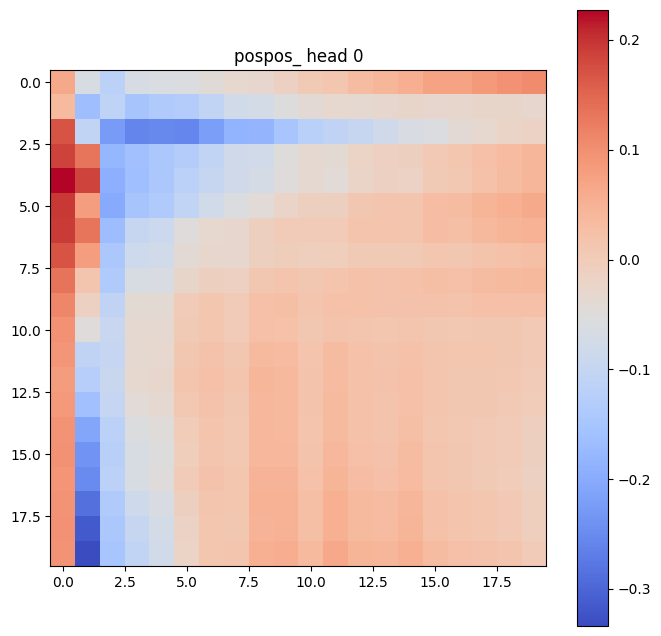

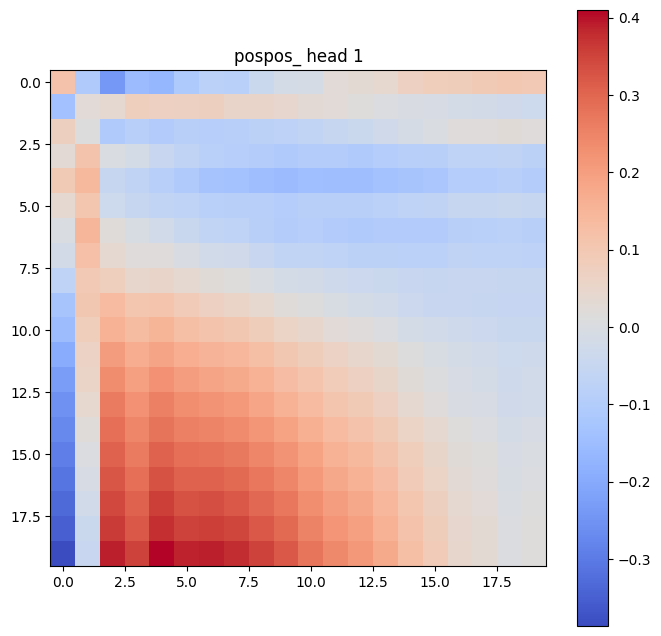

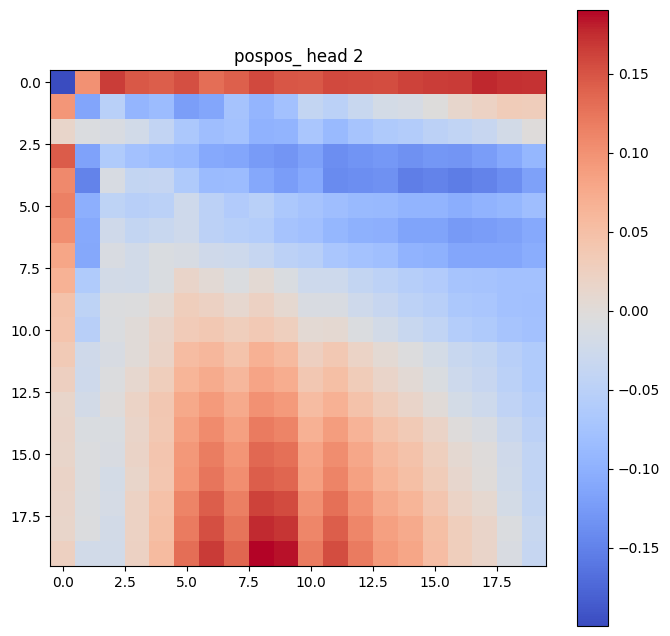

In [72]:
for h in range(3):
    plot_heatmap(posQ1posK1[h], title=f"pospos_ head {h}")

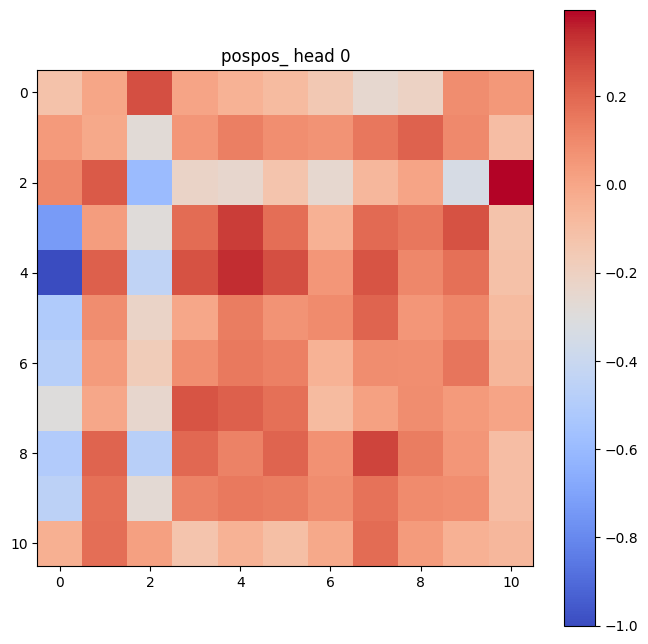

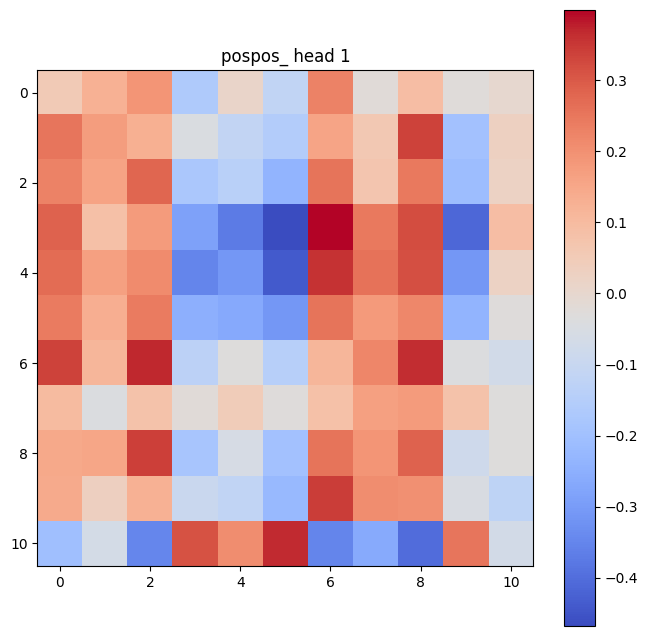

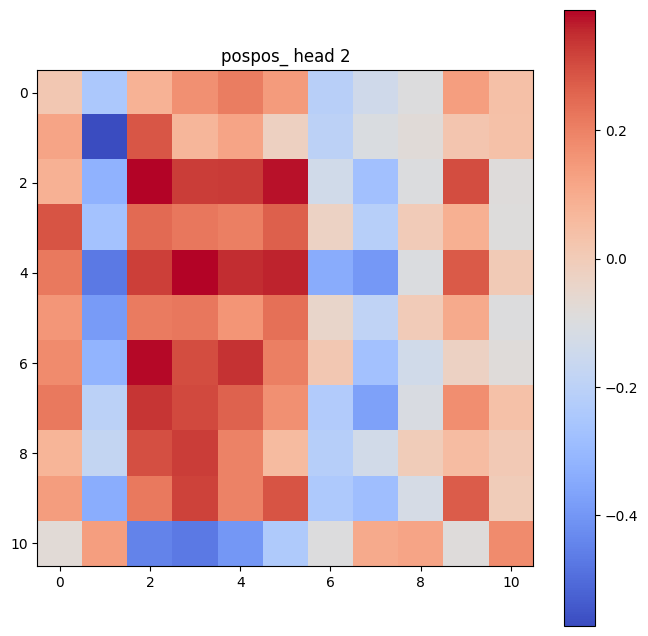

In [73]:
for h in range(3):
    plot_heatmap(eQ1eK1[h], title=f"pospos_ head {h}")


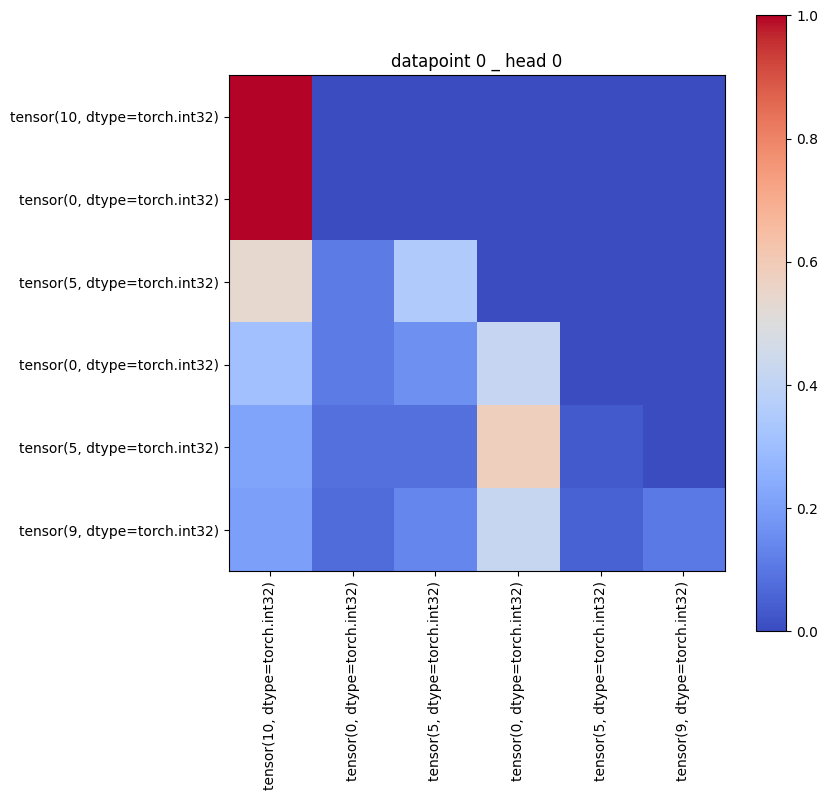

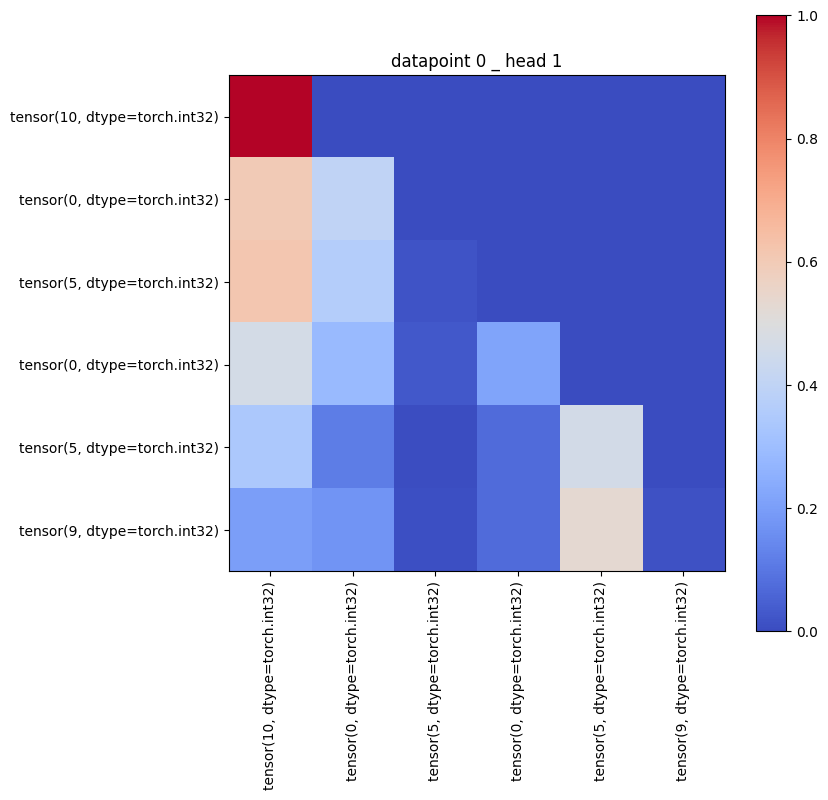

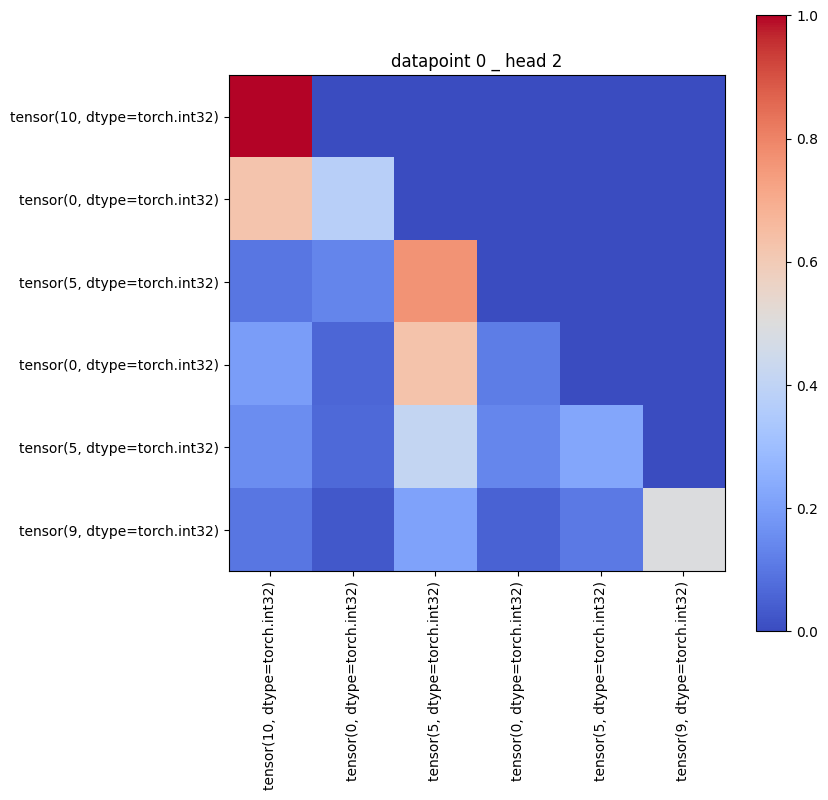

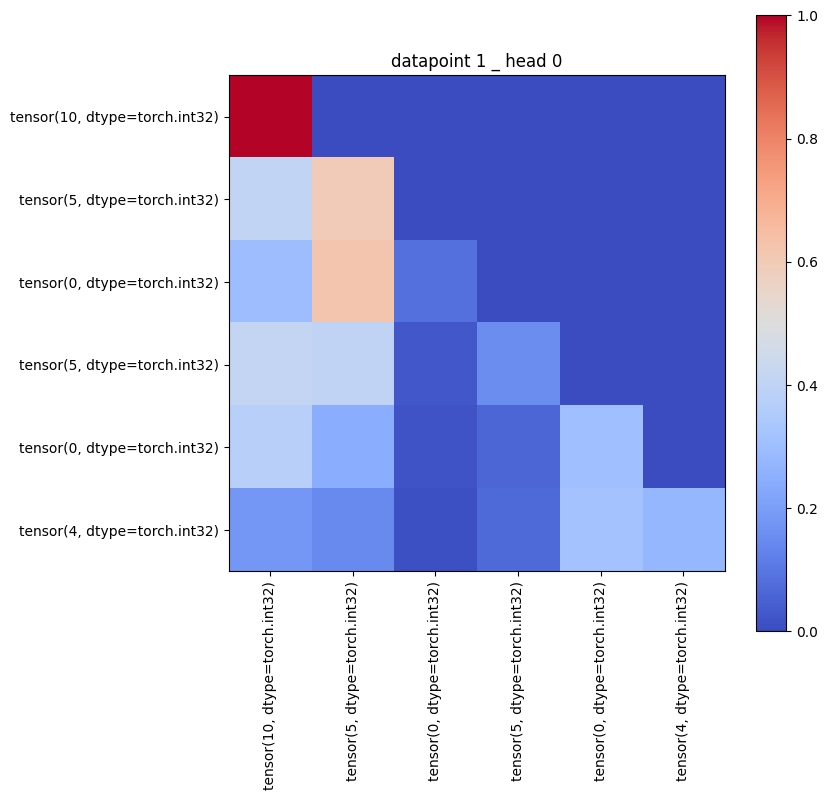

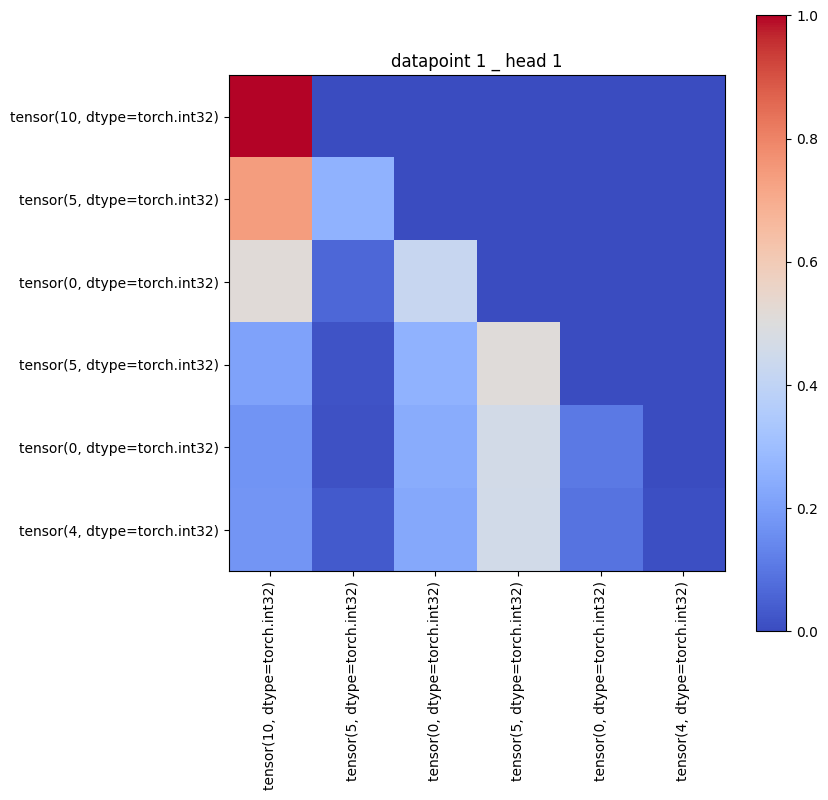

...

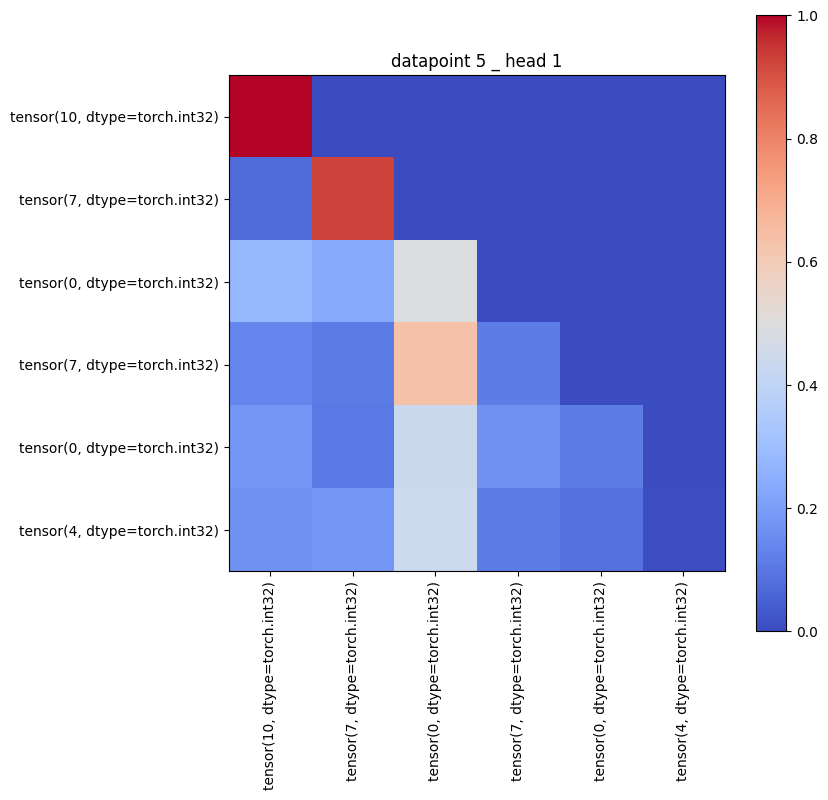

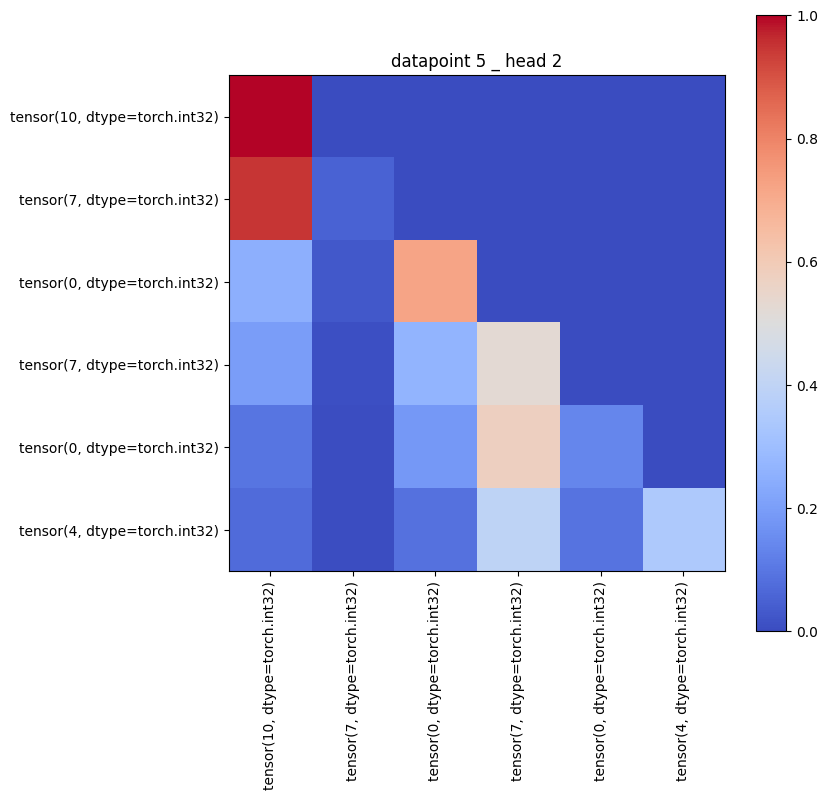

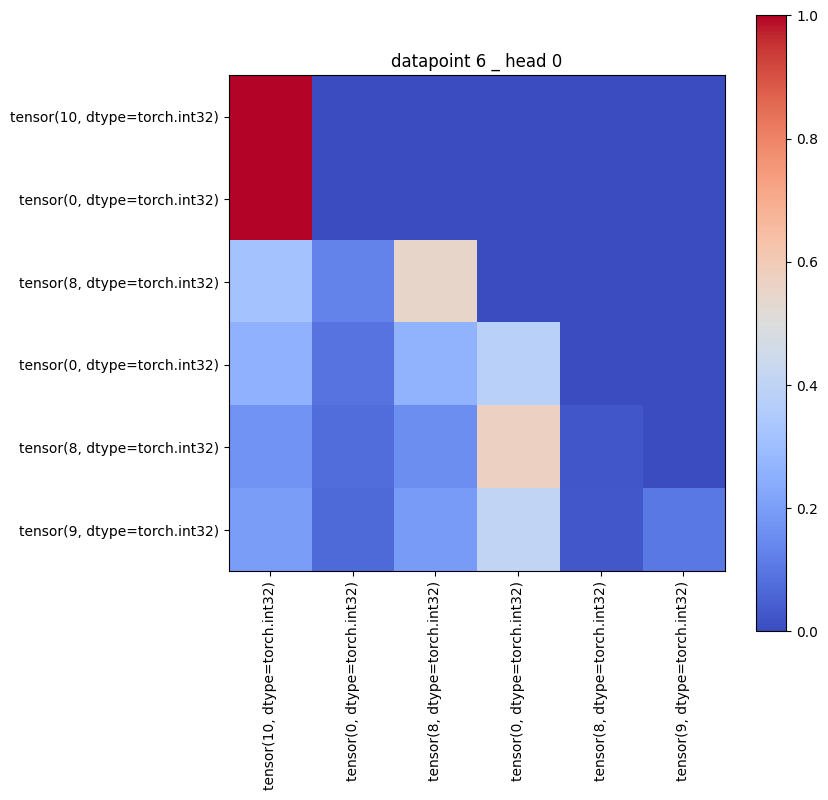

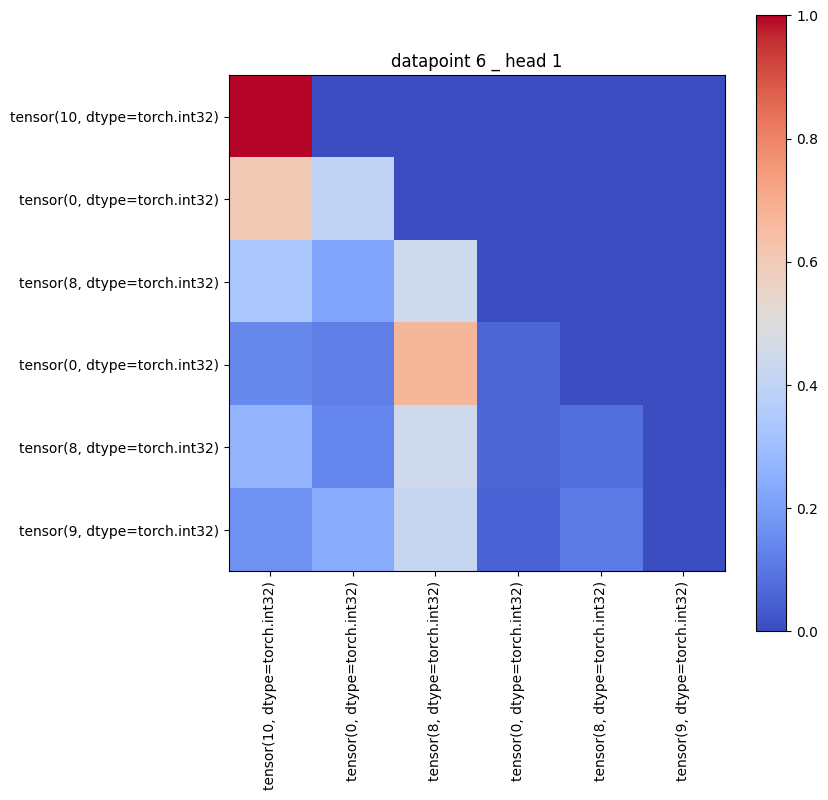

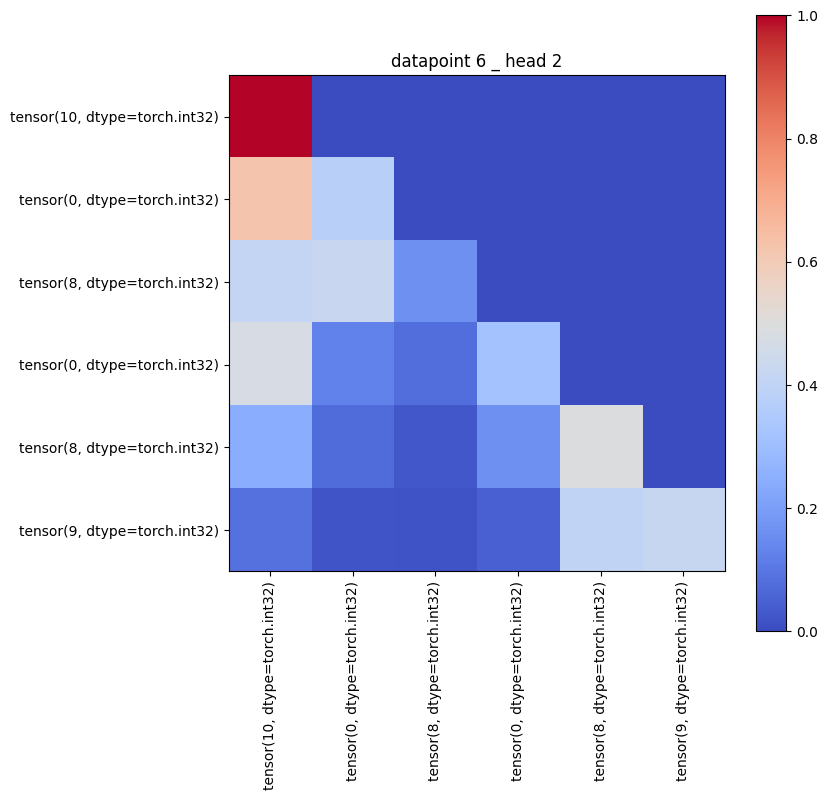


KeyboardInterrupt



In [172]:
for i in range(50):
    for h in range(3):
        plot_heatmap(cache['blocks.1.attn.hook_pattern'][i,h],dataset.toks[i], title=f"datapoint {i} _ head {h}")

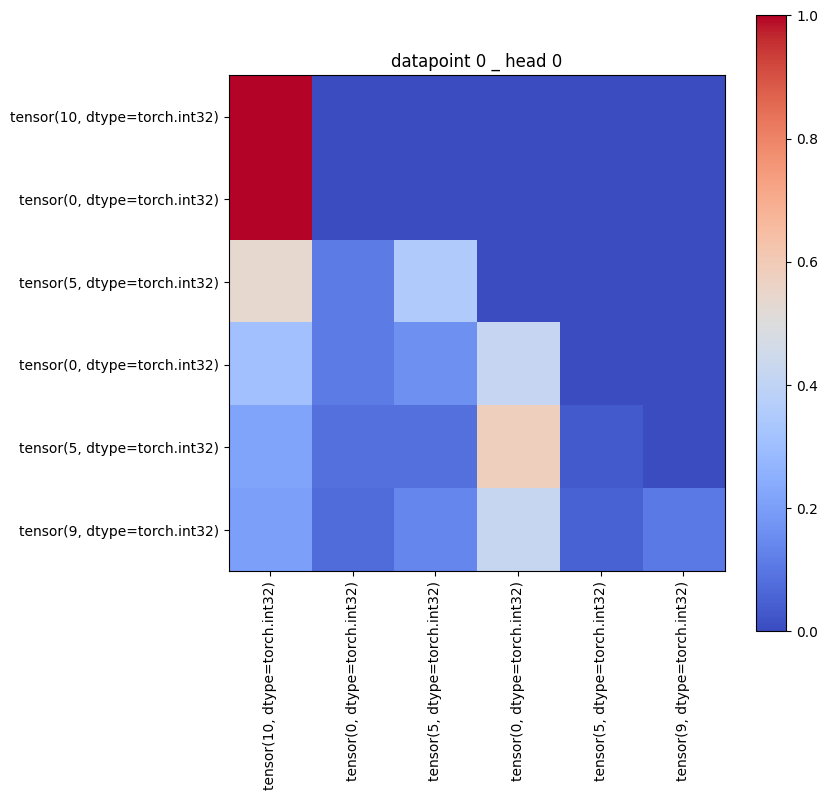

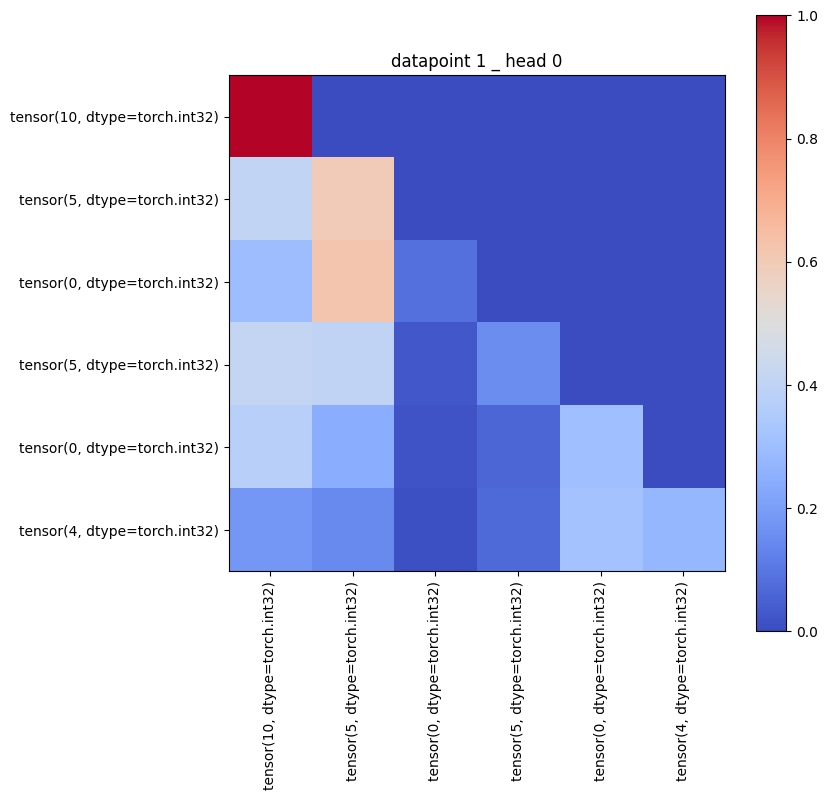

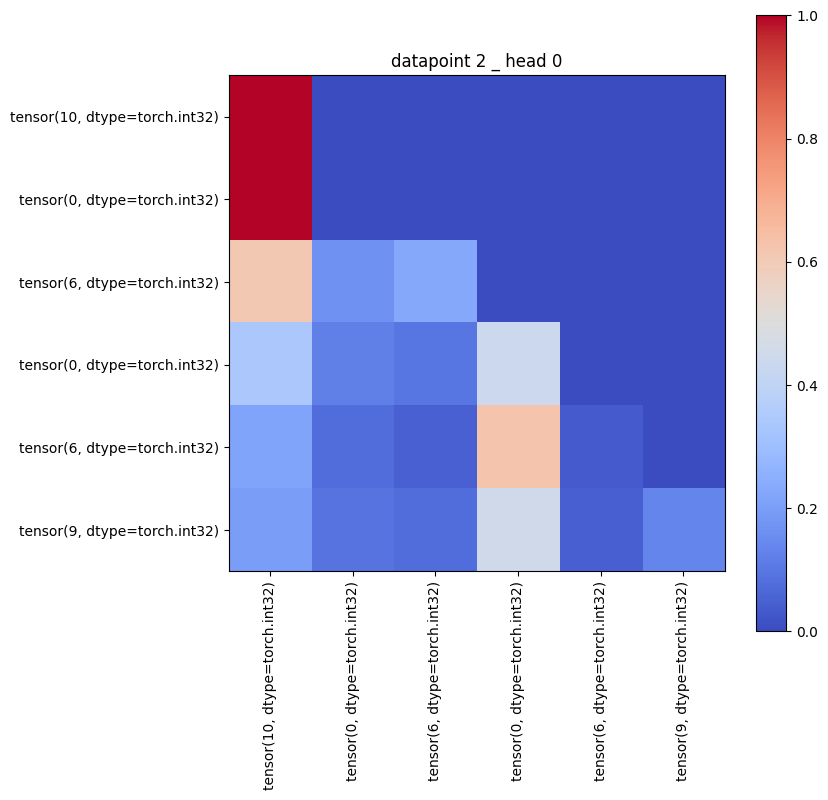

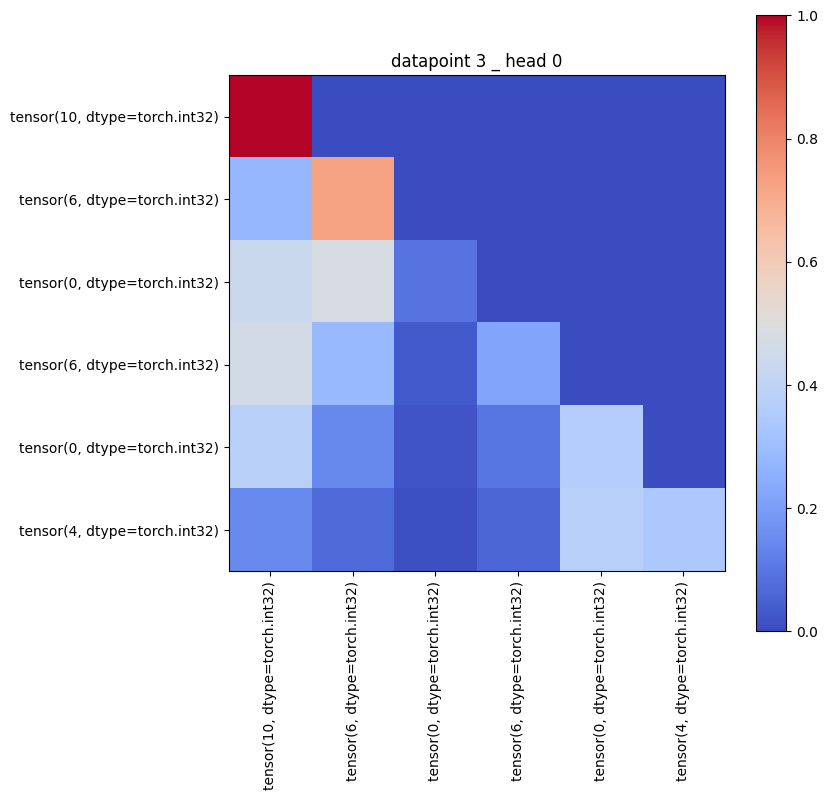

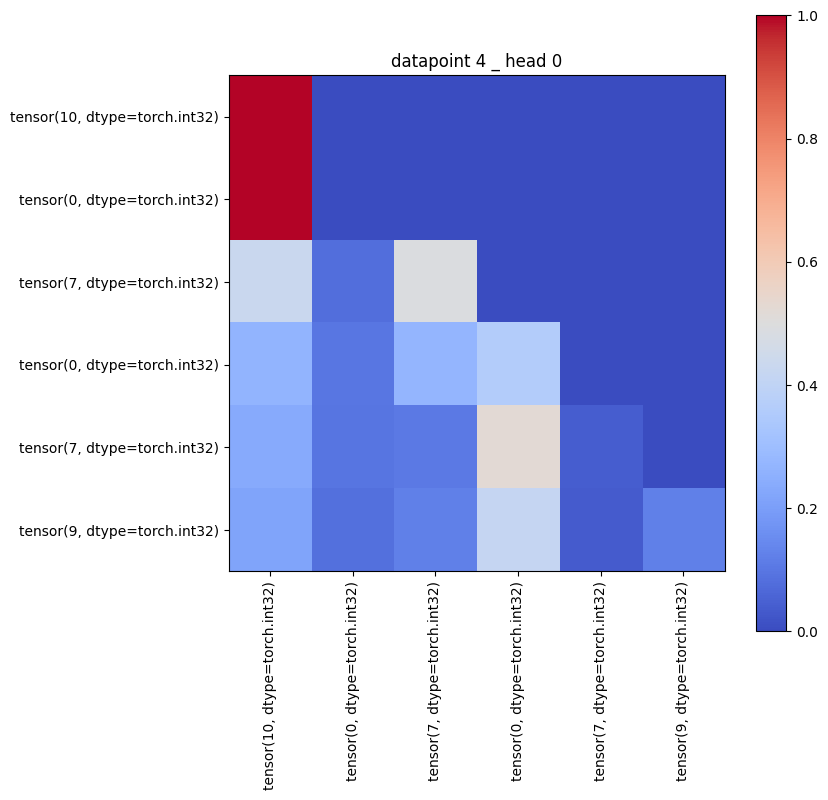

...

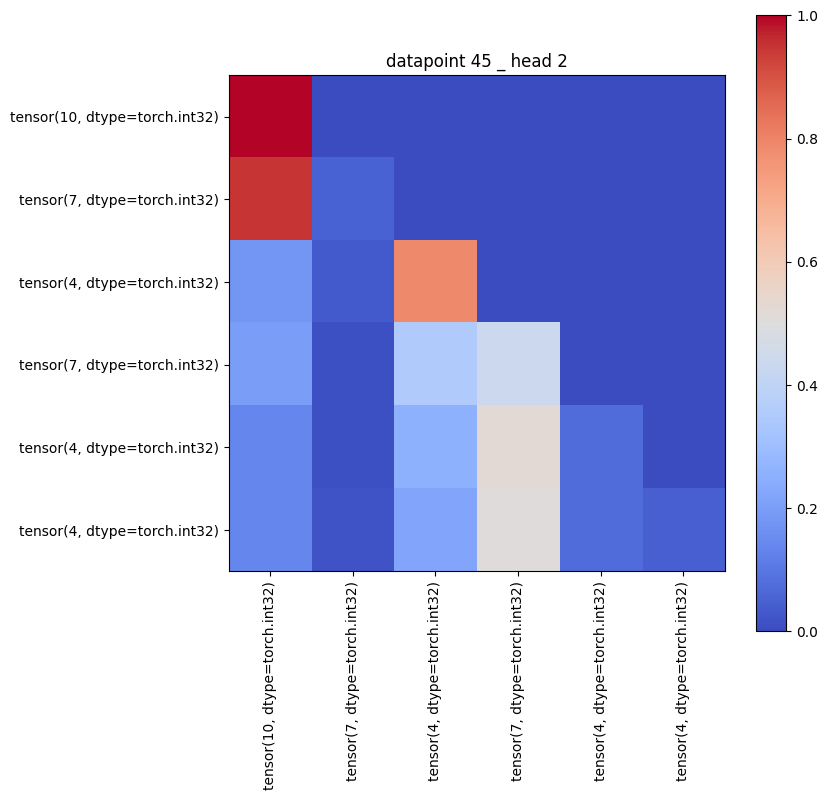

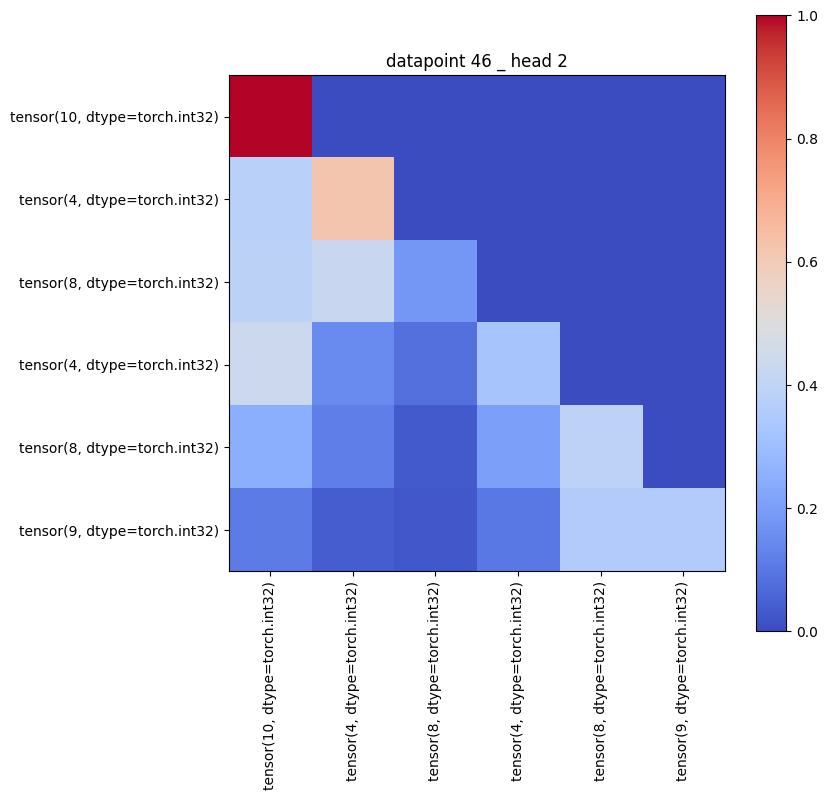

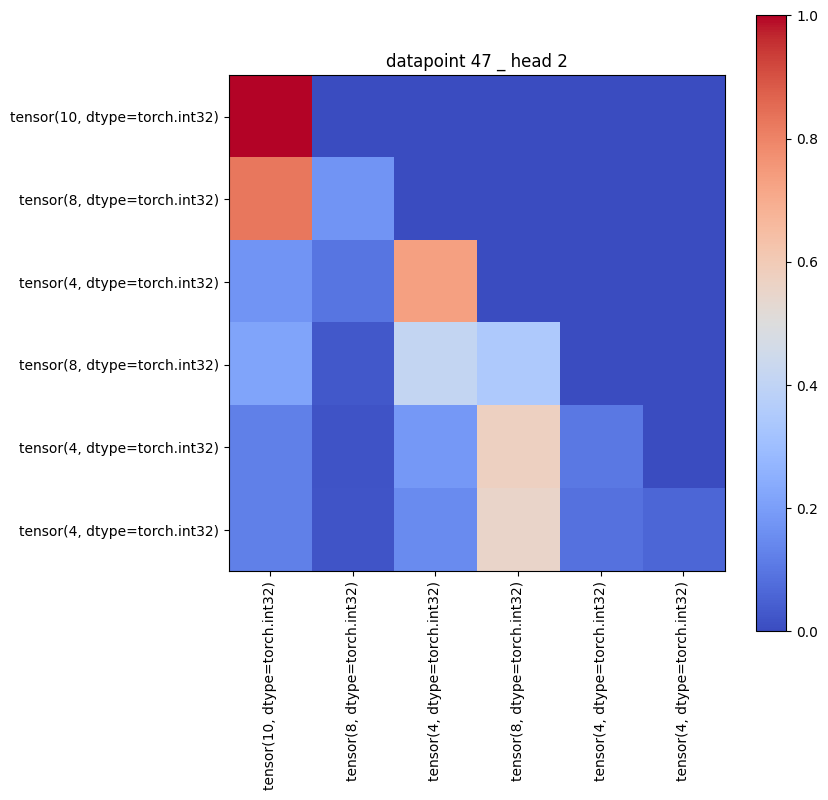

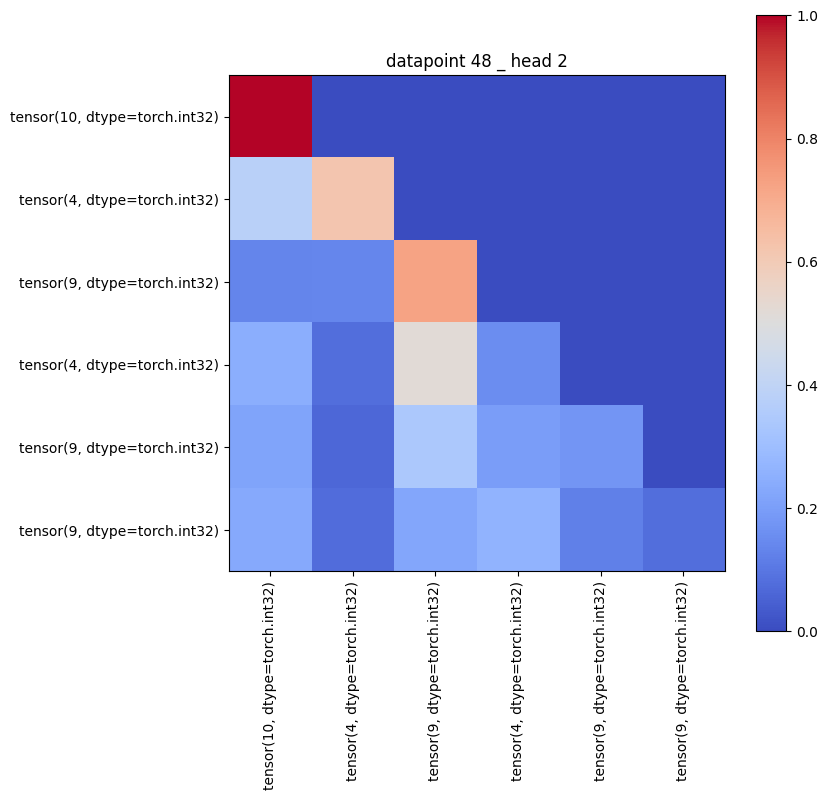

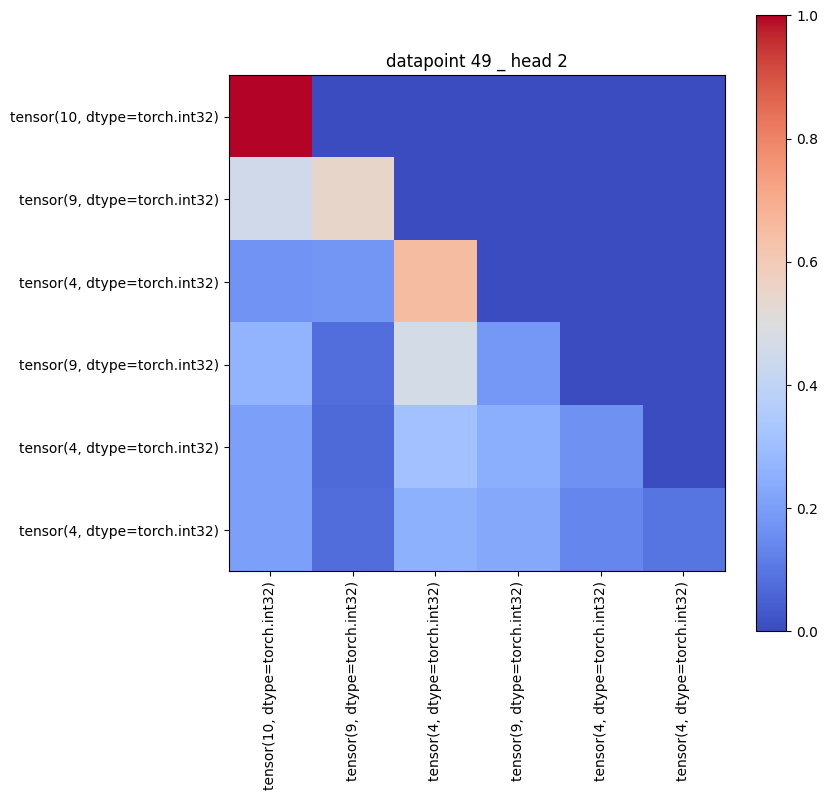

In [173]:
for h in range(3):
    for i in range(50):
        plot_heatmap(cache['blocks.1.attn.hook_pattern'][i,h],dataset.toks[i], title=f"datapoint {i} _ head {h}")

In [ ]:
imshow(
    probs[0].T,
    y=dataset.vocab,
    x=[f"{dataset.str_toks[0][i]}<br>({i})" for i in range(model.cfg.n_ctx)],
    labels={"x": "Token", "y": "Vocab"},
    xaxis_tickangle=0,
    title="Sample model probabilities (for batch idx = 0), with correct classification highlighted",
    text=[
        ["〇" if str_tok == correct_str_tok else "" for correct_str_tok in dataset.str_tok_labels[0]]
        for str_tok in dataset.vocab
    ], # text can be a 2D list of lists, with the same shape as the data
)

In [ ]:
# dataset = UniqueCharDataset(size=20, vocab=list("abcdef"), seq_len=6, seed=42)
# X = torch.zeros((20, 6), dtype=torch.int)

# for i, (seq, first_unique_char_seq) in enumerate(zip(dataset.str_toks, dataset.str_tok_labels)):
# #     print(f"Seq = {''.join(seq)}, Target = {''.join(first_unique_char_seq)}")
# #     print (seq)
#     for j in range(6):
#         index = fullstring.index(seq[j])
#         X[i,j] = int(index)
        
# print(X)

In [8]:
print(dataset)

In [ ]:
logits = model(X)
print(logits.shape)
probs = logits.softmax(-1)

print(probs[0][:])

# probs_palindrome = probs[:, 1]

# for tok, prob in zip(X.reshape(-1,22), probs_palindrome.reshape(-1)):
#     display_seq(tok, prob)

In [ ]:
from collections import defaultdict

activations = defaultdict(dict)
model.cache_all(activations, incl_bwd=False)
with torch.no_grad():
    output = model(X.reshape(-1,22))



In [ ]:
reshaped_attn_0 = activations['blocks.0.attn.hook_attn_scores'].reshape(2,31*31,2,22,22)
print(reshaped_attn_0.shape)
print("dataset, points, head, across, vertical")

In [14]:
import matplotlib.pyplot as plt
import torch



In [ ]:
reshaped_attn_0[0].shape

In [ ]:
def plot_attn0_hms(attn, i, j, k):
    plot_heatmap(attn[:,i,j,k].reshape(31,31))
    

In [ ]:
# Heads that should match for A form red line.
plot_attn0_hms(reshaped_attn_0[0], 0, -3, 1)
# But not for B
plot_attn0_hms(reshaped_attn_0[1], 0, -3, 1)

# Head 2 reverse effect?
plot_attn0_hms(reshaped_attn_0[0], 1, -3, 1)
# But not for B
plot_attn0_hms(reshaped_attn_0[1], 1, -3, 1)


In [ ]:
# REVERSED

# Heads that should match for A form red line.
plot_attn0_hms(reshaped_attn_0[0], 0, -11, 10)
# But not for B
plot_attn0_hms(reshaped_attn_0[1], 0, -11, 10)

# Head 2 reverse effect?
plot_attn0_hms(reshaped_attn_0[0], 1, -11, 10)
# But not for B
plot_attn0_hms(reshaped_attn_0[1], 1, -11, 10)

In [ ]:
print(W_Q_0.shape)
print(W_K_0.shape)

In [ ]:
print(activations['blocks.0.attn.hook_attn_scores'].shape)

In [ ]:
activations['blocks.0.attn.hook_k'].shape

In [ ]:
eQ = torch.einsum("ab,hbd->had",embed,W_Q_0)
eK = torch.einsum("ab,hbd->had",embed,W_K_0)

In [ ]:
print(eK.shape)

In [ ]:
for i in range(33):
    print(eK[0,i,:])

In [ ]:
eK[0,-2,:].shape

In [ ]:
torch.einsum("a,a->",eQ[0,-2,:],eQ[0,-5,:])

In [ ]:
(): HookPoint()
        (hook_q):

In [ ]:
k0 = activations['blocks.0.attn.hook_k'].reshape(2,31*31,22,2,14)
k0x = k0[1,:,-2,0,:]
print(k0x.shape)

q0 = activations['blocks.0.attn.hook_q'].reshape(2,31*31,22,2,14)
q0x = q0[1,:,-2,0,:]
print(q0x.shape)

In [ ]:
for i in range(14):
    plot_heatmap(k0x[:,i].reshape(31,31),i)
for i in range(14):
    plot_heatmap(q0x[:,i].reshape(31,31),i)

In [ ]:
for key, value in activations.items():
    print(f"Key: {key}")
    print(f"Shape: {value.shape}")

In [ ]:
plot_heatmap

In [ ]:
reshaped_attn_out_0 = activations['blocks.0.hook_attn_out'].reshape(2,31,31,22,28)


In [ ]:
print(reshaped_attn_out_0.shape)

In [ ]:
for i in range(28):
    plot_heatmap(reshaped_attn_out_0[0,:,:,-3,i],i)

In [ ]:
for i in range(28):
    plot_heatmap(reshaped_attn_out_0[1,:,:,-11,i],i)

In [ ]:
for i in range(28):
    plot_heatmap(reshaped_attn_out_0[0,:,:,-11,i],i)

In [ ]:
print(activations['blocks.0.hook_resid_post'].shape)
reshaped_resid_after0 = activations['blocks.0.hook_resid_post'].reshape(2,31,31,22,28)
print(reshaped_resid_after0.shape)

In [ ]:
for i in range(28):
    plot_heatmap(reshaped_resid_after0[0,:,:,-3,i],i)
    
for i in range(28):
    plot_heatmap(reshaped_resid_after0[0,:,:,-11,i],i)


In [ ]:
    
for i in range(28):
    plot_heatmap(reshaped_resid_after0[1,:,:,-2,i],i)
    
for i in range(28):
    plot_heatmap(reshaped_resid_after0[1,:,:,-11,i],i)

In [ ]:
# I was surprised that no diagonal patterns jumped out to me from V1
print(activations['blocks.1.attn.hook_v'].shape)
reshaped_V1 = activations['blocks.1.attn.hook_v'].reshape(2,31,31,22, 2,14)
print(reshaped_V1.shape)

In [ ]:
# 22 is length of seg, only care about -1.
# dataset, X, Y, output pos, head, embedding
reshaped_V1[:,:,:,-1,:,:].shape


In [ ]:
W_O_1 = model.blocks[1].attn.W_O
print(W_O_1.shape)
# posVO = torch.einsum("hbd,hde->hbe",posV,W_O_0)

In [ ]:
reshaped_VO1 = torch.einsum("bxyhe,heo->bxyho",reshaped_V1[:,:,:,-1,:,:],W_O_1)

In [ ]:
for i in range(14):
    plot_heatmap(reshaped_V1[0,:,:,-1,0,i],i)
    
for i in range(14):
    plot_heatmap(reshaped_V1[0,:,:,-1,1,i],i)
    

    
    

In [ ]:
for i in range(14):
    plot_heatmap(reshaped_V1[1,:,:,-1,0,i],i)
    
for i in range(14):
    plot_heatmap(reshaped_V1[1,:,:,-1,1,i],i)

In [ ]:
for i in range(28):
    plot_heatmap(reshaped_VO1[0,:,:,0,i],i)
    
for i in range(28):
    plot_heatmap(reshaped_VO1[0,:,:,1,i],i)

In [ ]:
for i in range(28):
    plot_heatmap(reshaped_VO1[1,:,:,0,i],i)
    
for i in range(28):
    plot_heatmap(reshaped_VO1[1,:,:,1,i],i)

In [ ]:
print(activations['blocks.1.attn.hook_attn_scores'].shape)
reshaped_attn1 = activations['blocks.1.attn.hook_attn_scores'].reshape(2,31,31,2, 22,22)
print(reshaped_attn1.shape)

In [ ]:
reshaped_attn1[0,:,:,0,-1]

In [ ]:
# dataset 0, head 0  - pattern on 20
for i in range(22):
    plot_heatmap(reshaped_attn1[0,:,:,0,-1,i],i)

# dataset 0, head 1 - pattern on 20
for i in range(22):
    plot_heatmap(reshaped_attn1[0,:,:,1,-1,i],i)




In [ ]:
# dataset 1, head 0 - pattern on 11
for i in range(22):
    plot_heatmap(reshaped_attn1[1,:,:,0,-1,i],i)

# dataset 1, head 1 - pattern on 11
for i in range(22):
    plot_heatmap(reshaped_attn1[1,:,:,1,-1,i],i)
    

In [ ]:
attn_result_1 = activations['blocks.1.attn.hook_result'][:,-1,:,:].reshape(2,31,31,2,28)
print(attn_result_1.shape)

In [ ]:
for i in range(28):
    plot_heatmap(attn_result_1[0,:,:,0,i],i)
    
for i in range(28):
    plot_heatmap(attn_result_1[0,:,:,1,i],i)
    


In [ ]:
for i in range(28):
    plot_heatmap(attn_result_1[1,:,:,0,i],i)
    
for i in range(28):
    plot_heatmap(attn_result_1[1,:,:,1,i],i)

In [ ]:
print(activations['blocks.1.hook_attn_out'].shape)
reshaped_attn_out1 = activations['blocks.1.hook_attn_out'].reshape(2,31,31,22,28)
print(reshaped_attn_out1.shape)

In [ ]:
# dataset 0 - pattern on all but 1
for i in range(28):
    plot_heatmap(reshaped_attn_out1[0,:,:,-1,i],i)




In [ ]:
# dataset 1 - pattern on all but 1
for i in range(28):
    plot_heatmap(reshaped_attn_out1[1,:,:,-1,i],i)

In [ ]:
print(activations['blocks.1.hook_resid_post'].shape)
resid_post_1 = activations['blocks.1.hook_resid_post'].reshape(2,31,31,22,28)
print(resid_post_1.shape)

In [ ]:
# dataset 0
for i in range(28):
    plot_heatmap(resid_post_1[0,:,:,-1,i],i)

# dataset 1
for i in range(28):
    plot_heatmap(resid_post_1[1,:,:,-1,i],i)

# day 3

some vo0 outputs are extreme for a given position.

In [ ]:
posVO.shape

In [ ]:
posVO[0].shape

In [ ]:
posVO[0][-2]

In [ ]:
posVO[0][-11]

In [ ]:
posVO.shape

In [ ]:
print(activations['blocks.1.attn.hook_q'][:,-1,0,:].mean(dim=0).shape)


In [ ]:
mean_q1 = activations['blocks.1.attn.hook_q'][:,-1,0,:].mean(dim=0)

In [ ]:
# torch.einsum(posVO[0][-2])

In [ ]:
W_K_1 = model.blocks[1].attn.W_K
print(W_K_1.shape)
print(posVO.shape)

In [ ]:
posVOK1 = torch.einsum("hde,hsd->hes",W_K_1,posVO)

In [ ]:
print(posVOK1.shape)
print(mean_q1.shape)

In [ ]:
attn1part = torch.einsum("hes,e->hs",posVOK1,mean_q1)

In [ ]:
print(attn1part.shape)

In [ ]:
attn1part[0]

In [ ]:
attn1part[1]

In [ ]:
# start here.
mean_v1 = activations['blocks.1.attn.hook_v'].mean(dim=0)[:,:,:]

In [ ]:
print(mean_v1[:,:].shape)

In [ ]:
import matplotlib.pyplot as plt
import torch

# Example tensor

# Create the x values (assuming they're just the indices)
x_values = torch.arange(14)

# Create a new figure
plt.figure(figsize=(10, 6))

# Loop through each of the 22 vectors
for i in range(11,21):
    # Plot the vector with a label
    plt.plot(x_values, mean_v1[i][1].detach().cpu().numpy(), label=f'Vector {i}')

# Add a legend to the plot
plt.legend()

# Show the plot
plt.show()


In [ ]:
import matplotlib.pyplot as plt
import torch

# Example tensor

# Create the x values (assuming they're just the indices)
x_values = torch.arange(14)

# Create a new figure
plt.figure(figsize=(10, 6))

# Loop through each of the 22 vectors
for i in [17,19,20]:
    # Plot the vector with a label
    plt.plot(x_values, mean_v1[i][1].detach().cpu().numpy(), label=f'Vector {i}')

# Add a legend to the plot
plt.legend()

# Show the plot
plt.show()

In [ ]:
import matplotlib.pyplot as plt
import torch

# Example tensor

# Create the x values (assuming they're just the indices)
x_values = torch.arange(14)

# Create a new figure
plt.figure(figsize=(10, 6))

# Loop through each of the 22 vectors
for i in [11,12,13,14,15,16,18]:
    # Plot the vector with a label
    plt.plot(x_values, mean_v1[i][1].detach().cpu().numpy(), label=f'Vector {i}')

# Add a legend to the plot
plt.legend()

# Show the plot
plt.show()

In [ ]:
model.blocks[1].attn.W_V.shape

# 4) Post

In [ ]:
posVO[0].shape

In [ ]:

# Initialize a tensor to store the dot products
dot_products = torch.zeros((22, 22))

# Calculate the dot products
for i in range(22):
    for j in range(22):
        dot_products[i, j] = torch.dot(torch.abs(posVO[0,i, :]), posVO[0,j, :])
plot_heatmap(dot_products,"foo")

In [ ]:

# Initialize a tensor to store the dot products
dot_products = torch.zeros((22, 22))

# Calculate the dot products
for i in range(22):
    for j in range(22):
        dot_products[i, j] = torch.dot(torch.abs(posVO[0,i, :]), torch.abs(posVO[0,j, :]))
plot_heatmap(dot_products,"foo")

In [ ]:

# Initialize a tensor to store the dot products
dot_products = torch.zeros((22, 22))

# Calculate the dot products
for i in range(22):
    for j in range(22):
        dot_products[i, j] = torch.dot(torch.abs(posVO[0,i, :]), torch.abs(posVO[0,j, :]))
plot_heatmap(dot_products,"foo")

In [ ]:
plot_heatmap(dot_products,"0.1")